# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

# Часть 1. Статистические модели

### Загрузка библиотек

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

### 1. Подготовка и предобработка данных

Исходный датасет по композитам

###### Датасет со свойствами композитов. Объединение по индексу, тип объединения INNER

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Определение количества строк и столбцов объекта, метод shape
x_bp.shape

(1023, 10)

In [4]:
# Вывод сведений об объекте DataFrame, метод info()
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [5]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [6]:
# Определение количества строк и столбцов объекта, метод shape
x_nup.shape

(1040, 3)

In [7]:
# Вывод сведений об объекте DataFrame, метод info()
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1040 entries, 0.0 to 1039.0
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   float64
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(3)
memory usage: 32.5 KB


In [8]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df_s = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [9]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

Вывод: соединение произведено по индексам, и часть данных была отброшена при соединении датасетов в общий новый датасет. Тип данных во всех колонках - float64.

In [10]:
# Изменение типа данных индекса, метод astype('int')
df_s.index = df_s.index.astype('int')
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


Вывод: индексы - целые числа

In [11]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(df_s.isnull().sum())
print()
print(df_s.isna().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град  

Вывод: пропуски в датасете отсутствуют

In [12]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
df_s.duplicated().sum()

0

Выводы: дубликаты в датасете отсутствуют

ПРЕДВАРИТЕЛЬНОЕ ЗАКЛЮЧЕНИЕ ПО ДАТАСЕТУ: датасет качественный: пропуски и дубликаты в датасете отсутствуют, вероятно он подвергался какой-то обработке заранее. 


Датасет представляет собой результаты испытаний на растяжение композитных материалов, тем не менее, данные, которые относятся к результатам замера геометрических параметров образцов, в нем отсутствуют. Восполним этот пробел и создадим соответствующие столбцы:

In [13]:
# Относительное удлинение при растяжении без нормирования 
df_s['Относительное удлинение при растяжении'] = df_s['Прочность при растяжении, МПа'] / df_s['Модуль упругости при растяжении, ГПа']

In [14]:
# относительное удлиненее без нормирования
df_s['Относительное удлинение'] = df_s['Прочность при растяжении, МПа'] / df_s['модуль упругости, ГПа']

In [15]:
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000,42.857143,4.060986
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000,42.857143,4.060986
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000,42.857143,3.984064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074,27.980012,2.794045


In [16]:
# Определение количества строк и столбцов датасета df_s, метод shape
df_s.shape

(1023, 15)

In [17]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

Вывод: в колонке 'Угол нашивки, град' всего два значения, в остальных столбцах гораздо больше, например в столбце 'модуль упругости, ГПа' таковых 1020 из 1023

In [18]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
df_s['Угол нашивки, град'].unique()

array([ 0., 90.])

Вывод: категориальный параметр 'Угол нашивки, град' имеет всего два уровня, может рассматриваться как порядковый и для дальнейшей обработки подвергается ранжировке

In [19]:
# Подсчет количества строк по уникальным значениям столбца 'Угол нашивки, град', метод count()
df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count()

520

In [20]:
print('count, 0 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())
print('count, 90 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 90.0].count())
print('count, 90 degeree, проверка: ', df_s.shape[0] - df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())

count, 0 degeree:  520
count, 90 degeree:  503
count, 90 degeree, проверка:  503


In [21]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('float64')

In [22]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df_s = df_s.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)

In [23]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [24]:
# Описательная статистика датасета df_s, метод describe()
df_s.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901,55.351970,1090.580554


###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

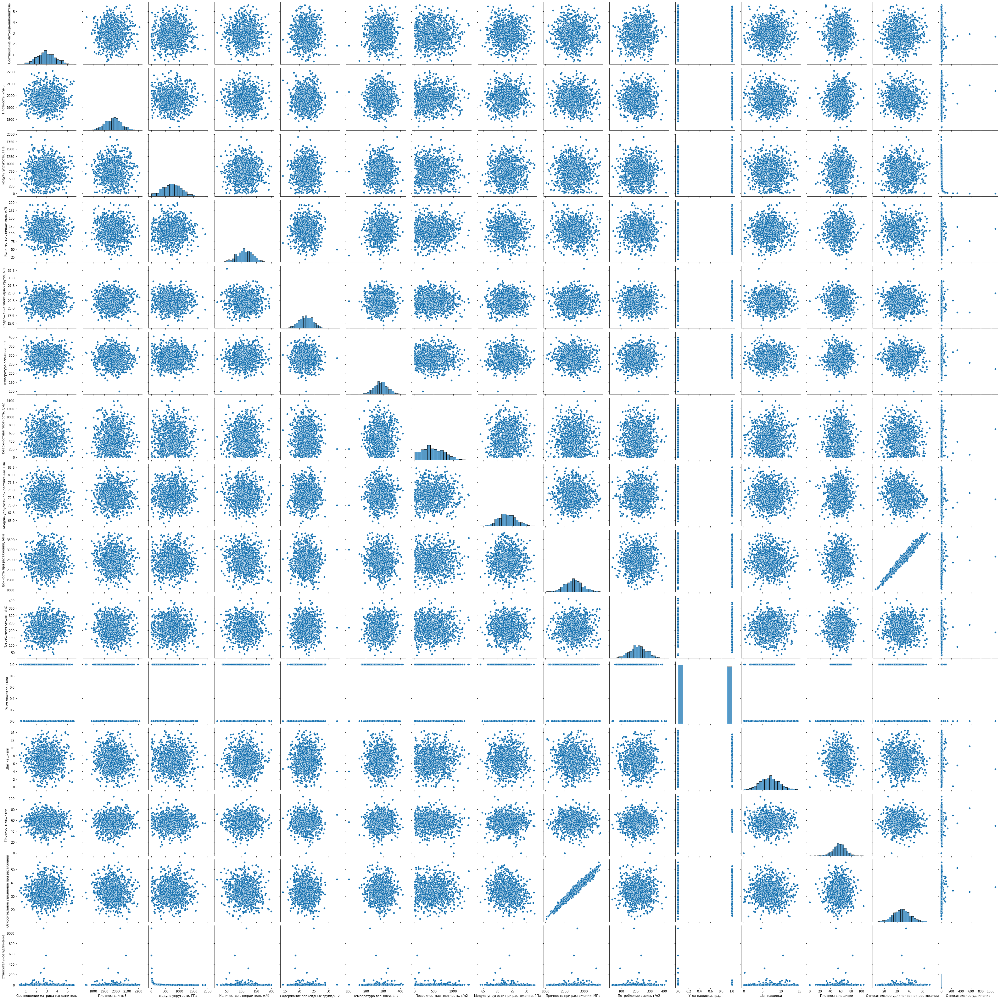

In [25]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(df_s, height=3)

Вывод: попарные графики рассеяния не показывают какой-либо зависимости между параметрами, впечатление кучности, вид случайных данных с нормальным распределением, кроме данных столбца 'Угол нашивки', которые являются категориальной переменной и имеют два ранжированных уровня: 0 и 1, а также столбцов 'Относительное удлинение при растяжении' и 'Относительное удлинение'. Столбец 'Относительное удлинение при растяжении' показывает связь со столбцом 'Прочность при растяжении, МПа'

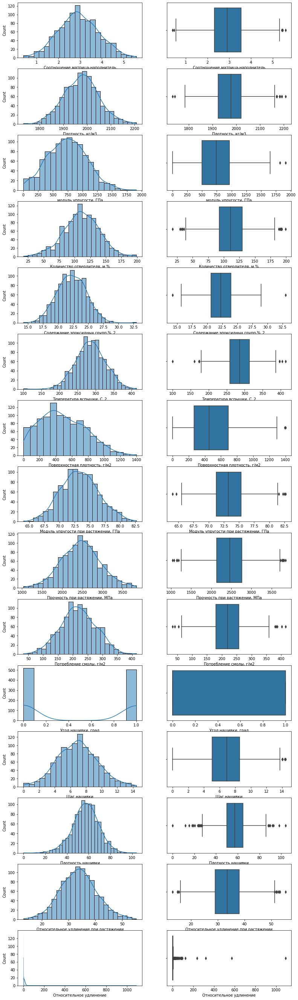

In [26]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(15, 2, figsize=(13, 48))
for k, column in enumerate(df_s.columns):    
    sns.histplot(data=df_s, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df_s, x=column, ax=axes[k, 1])
plt.show()

Вывод: на первый взгляд, судя по графикам распределения переменных параметров близки к нормальным, кроме 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Угол нашивки' и 'Относительное удлинение'. Судя по графикам рассеяния и графикам "ящики с усами", имеются выбросы.

Требуется дополнительно оценить нормальность распределения параметров по статистическому критерию.

Требуется оценить также корреляцию параметров между собой, а для параметров, имеющих статистически значимую корреляцию, выполнить построение модели статистической регрессии и оценить ее статистическую адекватность.

Требуется произвести сравнение двух групп данных по столбцу 'Угол нашивки' для оценки влияния этого категориального параметра на  количественные параметры датасета.

Требуется очистить данные от выбросов.

###### Создание датасета с исключенным категориальным параметром

In [27]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [28]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
df_d=df_s[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_d.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0,42.857143,3.984064


In [29]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Вывод: столбец 'Угол нашивки, град' в датасете df_d отсутствует

### 2. Оценка нормальности распределения параметров

In [30]:
# Описательная статистика датасета df_d, метод describe()
df_d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,14.440522,103.988901,55.351970,1090.580554


In [31]:
# Описательная статистика датасета df_d, метод describe() библиотеки scipy.stats
stats.describe(df_d)

DescribeResult(nobs=1023, minmax=(array([3.89402605e-01, 1.73176464e+03, 2.43690875e+00, 1.77402746e+01,
       1.42549855e+01, 1.00000000e+02, 6.03739925e-01, 6.40540606e+01,
       1.03685661e+03, 3.38030255e+01, 0.00000000e+00, 0.00000000e+00,
       1.30980051e+01, 8.81993807e-01]), array([   5.5917416 , 2207.77348061, 1911.536477  ,  198.95320719,
         33.        ,  413.27341824, 1399.54236234,   82.68205104,
       3848.43673188,  414.59062836,   14.44052188,  103.9889013 ,
         55.35197013, 1090.58055367])), mean=array([   2.93036577, 1975.73488811,  739.92323276,  110.57076865,
         22.24438955,  285.88215135,  482.73183304,   73.32857125,
       2466.9228427 ,  218.42314368,    6.89922208,   57.15392943,
         33.70432942,    7.42761261]), variance=array([8.33974853e-01, 5.43599944e+03, 1.09052897e+05, 8.00658596e+02,
       5.79028591e+00, 1.67635054e+03, 7.91379549e+04, 9.72805426e+00,
       2.35834560e+05, 3.56838144e+03, 6.57136343e+00, 1.52546430e+02,
    

In [32]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in df_d.columns:
    med = statistics.median(df_d[col])
    mean = statistics.mean(df_d[col])
    mod = statistics.mode(df_d[col])
    std = statistics.stdev(df_d[col])
    var = statistics.variance(df_d[col])
    skew = stats.skew(df_d[col])
    kurt = stats.kurtosis(df_d[col])
    max_ = (df_d[col]).max()
    min_ = (df_d[col]).min()
    scope = (df_d[col]).max() - (df_d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(df_d[col]), scale=stats.sem(df_d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.9303657734325483 	Медиана:  2.90687765033521 	Мода :  1.85714285714285 
Стандарт :  0.9132222362148388 	Дисперсия:  0.8339748527172307 
Асимметрия:  0.08215047390733503 	Эксцесс:  -0.20422037310846086 
Минимум:  0.389402605178414 	Максимум:  5.59174159869754 	Размах:  5.202338993519127 
ДоверитИнтервалСредн:  (2.8744046078183585, 2.9863269390467426)

 	 Плотность, кг/м3 : 	 
Среднее:  1975.7348881101545 	Медиана:  1977.62165679058 	Мода :  2030.0 
Стандарт :  73.72923055065388 	Дисперсия:  5435.999437591473 
Асимметрия:  0.05854323312878896 	Эксцесс:  0.05745882123102097 
Минимум:  1731.764635096 	Максимум:  2207.77348061119 	Размах:  476.00884551518993 
ДоверитИнтервалСредн:  (1971.2168491073446, 1980.252927112965)

 	 модуль упругости, ГПа : 	 
Среднее:  739.9232327560723 	Медиана:  739.664327697792 	Мода :  738.736842105263 
Стандарт :  330.23158056102693 	Дисперсия:  109052.89679983404 
Асимметрия:  0.11999727729086174 	Эксцесс: 

Вывод: по всем столбцам, кроме 'Относительное удлинение', средние значения укладываются в доверительные интервалы для средних, мода смещена для некоторых параметров, стандартное отклонение имеет порядок ниже размаха, асимметрия и эксцесс близки к нормальным (близки к 0). Создается впечатление в целом нормального распределения всех параметров.

Примечание: оценка эксцесса рассчитывается по формуле, из которой вычитается 3, чтобы упростить сравнение с нормальным распределением

Тест д'Агостино (по имени Ralph D’Agostino) вычисляет итоговую статистику на основе распределения( эксцесс и асимметрия), чтобы определить, отклоняется ли рассматриваемое распределение данных от нормального, задан уровень значимости 0,05.

Параметр 'Угол нашивки, град' изначально не имеет нормального распределения, поэтому по нему не рассчитывается тест д'Агостино.

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [33]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.084, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=0.824, p-value=0.662
модуль упругости, ГПа : 	 	 	Statistics=4.556, p-value=0.103
Количество отвердителя, м.% : 	 	 	Statistics=2.223, p-value=0.329
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.629, p-value=0.730
Температура вспышки, С_2 : 	 	 	Statistics=2.018, p-value=0.365
Поверхностная плотность, г/м2 : 	 	 	Statistics=38.511, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.946, p-value=0.139
Прочность при растяжении, МПа : 	 	 	Statistics=1.109, p-value=0.574
Потребление смолы, г/м2 : 	 	 	Statistics=0.645, p-value=0.724
Шаг нашивки : 	 	 	Statistics=1.785, p-value=0.410
Плотность нашивки : 	 	 	Statistics=25.992, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=2.450, p-value=0.294
Относительное удлинение : 	 	 	Statistics=2367.429, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матр

Вывод: по тесту по д'Агостино параметры 'Поверхностная плотность, г/м2', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

Критерий Шапиро-Уилка применяется для выборок до 5000 наблюдений, поэтому может быть применен и здесь

In [34]:
# Количество наблюдений, метод shape
df_d.shape[0]

1023

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [35]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.709
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.373
Относительное удлинение : 	 	 	Statistics=0.078, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05).

Критерий  Шапиро-Уилка оказался чувствительнее, параметр 'модуль упругости, ГПа' не подчиняется нормальному распределению, так же, как и параметры 'Поверхностная плотность' и 'Плотность нашивки'

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

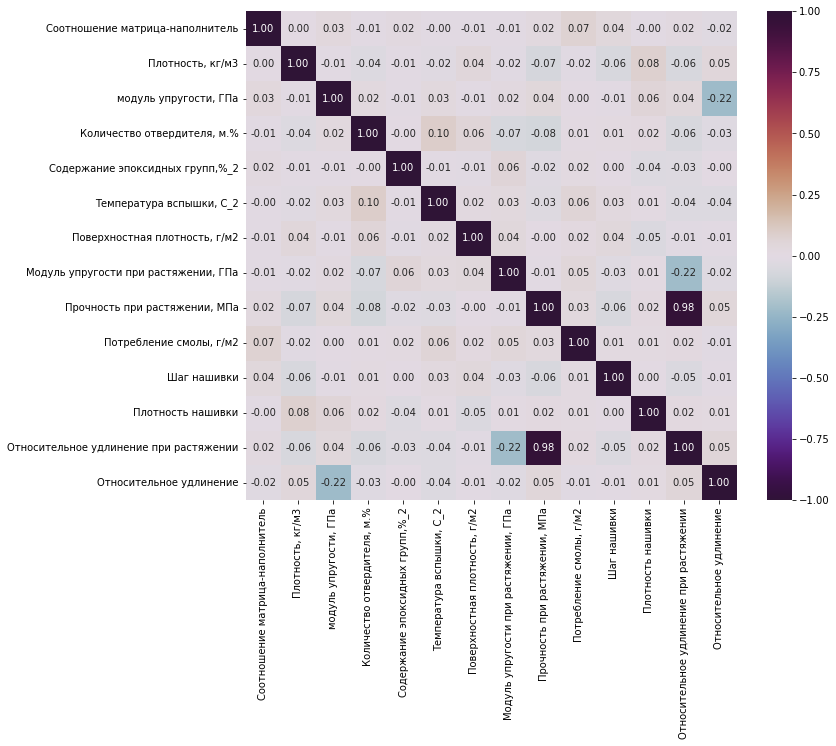

In [36]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Вывод: судя по матрице корреляции, построенной на основании корреляции по Пирсону для количественных данных, коэффициенты корреляции малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они связаны детерминистически), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между всеми количественными параметрами.

In [37]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [38]:
# Проверка по критерию Пирсона
count = 0 
for col in df_d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_d[col], df_d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.073, p-value=0.020





2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.062, p-value=0.046


3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.223, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.095, p-value=0.002


Наименование колонок и строк С 

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

Учитывая, что изначально присутствует категориальный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

In [39]:
# ранговая корреляция Спирмена с учетом того, что присутствует категориальный параметр 'Угол нашивки'
df_s.corr(method='spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570,0.015541,-0.016903
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001,-0.060979,-0.005448
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628,0.030159,-0.911262
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265,-0.057493,-0.056531
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182,-0.033359,-0.013232
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160,-0.034829,-0.030066
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404,-0.016527,-0.002281
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225,-0.215380,-0.018945
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950,0.973655,0.331721
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236,0.006211,0.006243


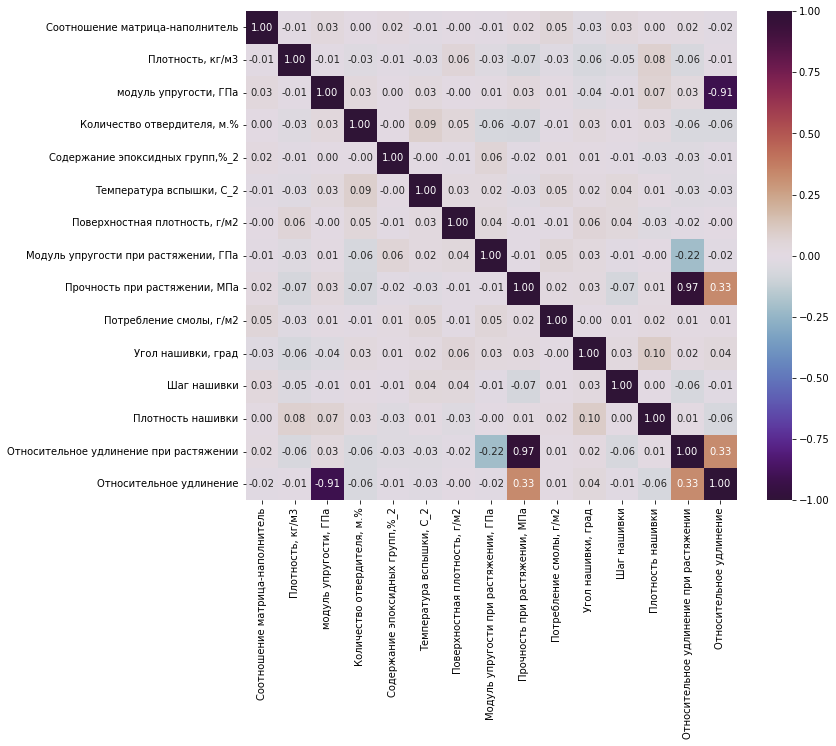

In [40]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(df_s.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

Вывод: судя по матрице корреляции, построенной на основании корреляции по Спирмену для количественных и качественных данных, коэффициенты корреляцим малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они связаны детерминистически), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между категориальным параметром 'Угол нашивки, град' и остальными параметрами.

In [41]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [42]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_s['Угол нашивки, град'] , df_s[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.019, p-value=0.553
Относительное удлинение : 	 	 	Statistics=0.037, p-value=0.243

Наименование колонок,

Вывод: существует статистически значимая попарная корреляционная связь по критерию Спирмена между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'.

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих параметров между собой и с остальными параметрами следует проверять по критерию Спирмена

In [43]:
# Проверка по критерию Спирмена
count = 0 
for col in df_s.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_s.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_s[col], df_s[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель















2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010



3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.911, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердит

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.101, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.332, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.063, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.327, p-value=0.000

### 4. Статистическое сравнение 2-х групп (углы нашивки 0 и 90 град)

In [44]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Статистическое сравнение 2х групп (углы нашивки, ранги 0 и 1) возможно осуществить по критерию Колмогорова-Смирнова (для категориальных переменных).

Формулировка гипотезы по критерию Колмогорова-Смирнова (для категориальных переменных):

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [45]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.046, p-value=0.615
Относительное удлинение : 	 	 	Statistics=0.054, p-value=0.414

Наименование колонок, для

Вывод: критерий Колмогорова-Смирнова сравнения групп для категориальных ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

Подсчет средних значений по вышеуказанным параметрам:

In [46]:
# 'модуль упругости, ГПа' по двум группам
groups_E= df_s.groupby(['Угол нашивки, град'])['модуль упругости, ГПа'].mean()
groups_E

Угол нашивки, град
0    748.17435
1    731.39325
Name: модуль упругости, ГПа, dtype: float64

In [47]:
# 'Плотность нашивки' по двум группам
groups_P= df_s.groupby(['Угол нашивки, град'])['Плотность нашивки'].mean()
groups_P

Угол нашивки, град
0    55.843291
1    58.508864
Name: Плотность нашивки, dtype: float64

Следует выполнить однофакторный анализ для оценки различия средних по двум группам угла нашивки (углы нашивки с рангами 0 и 1)

In [48]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

In [49]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [50]:
# Определение уникальных значений в столбце 'Угол нашивки, град' датасета df_s, метод unique()
df_s['Угол нашивки, град'].unique()

array([0, 1])

In [51]:
# Тип данных столбца 'Угол нашивки' датасета df_s, метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [52]:
# Определение типа данных столбца 'Угол нашивки, град' датасета df_s, метод type() библиотеки numpy
type(df_s['Угол нашивки, град'][0])

numpy.int32

Тест:

In [53]:
# Создание групп по качественному параметру 'Угол нашивки, град' для проверки равенства 
# средних параметра 'Модуль упругости при растяжении, ГПа' по этим двум группам
group1 = df_s[df_s['Угол нашивки, град'] == 0]['Модуль упругости при растяжении, ГПа']
group2 = df_s[df_s['Угол нашивки, град'] == 1]['Модуль упругости при растяжении, ГПа']

In [54]:
# Тест функции f_oneway библиотеки scipy.stats
f_oneway(group1, group2)

F_onewayResult(statistic=0.5405592920742476, pvalue=0.4623698756783441)

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [55]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_s.columns[:10]:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col])
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))
for col in df_s.columns[11:]:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col])
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))


Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=1.357, p-value=0.244
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.987, p-value=0.321
Плотность, кг/м3 : 	 	 	Statistics Bartlet=0.172, p-value=0.678
Плотность, кг/м3 : 	 	 	Statistics F-test=4.810, p-value=0.029
модуль упругости, ГПа : 	 	 	Statistics Bartlet=0.303, p-value=0.582
модуль упругости, ГПа : 	 	 	Statistics F-test=0.660, p-value=0.417
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=0.094, p-value=0.759
Количество отвердителя, м.% : 	 	 	Statistics F-test=1.521, p-value=0.218
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=0.025, p-value=0.875
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.066, p-value=0.797
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=0.219, p-value=0.640
Температура вспышки, С_2 : 	 	 	Statistics F-test=0.437, p-value=0.509
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=0.125, p-value=0.724
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: различаются средние для 'Плотность, кг/м3', 'Плотность нашивки'. Но Bartlet-test для 'Плотность нашивки' показывает, что группы имеют не равные дисперсии для плотности нашивки, поэтому F-test не может быть применен для 'Плотность нашивки'

Вывод: создается впечатление малого влияния категориального параметра 'Угол нашивки, град' на датасет в целом

###### Очистка данных от выбросов: 

In [56]:
# Вывод сведений о датасете df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

Вывод: датасет качественный, очистка данных от выбросов не осуществляется с целью максимального сохранения исходных данных

In [57]:
# Вывод сведений о датасете df
df = df_s.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [58]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [59]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [60]:
# Описательная статистика нормализованного датасета df
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616,0.487678,0.006007
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772,0.160786,0.037767
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890,0.378153,0.001472
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423,0.485273,0.002328
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537,0.589120,0.003666
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


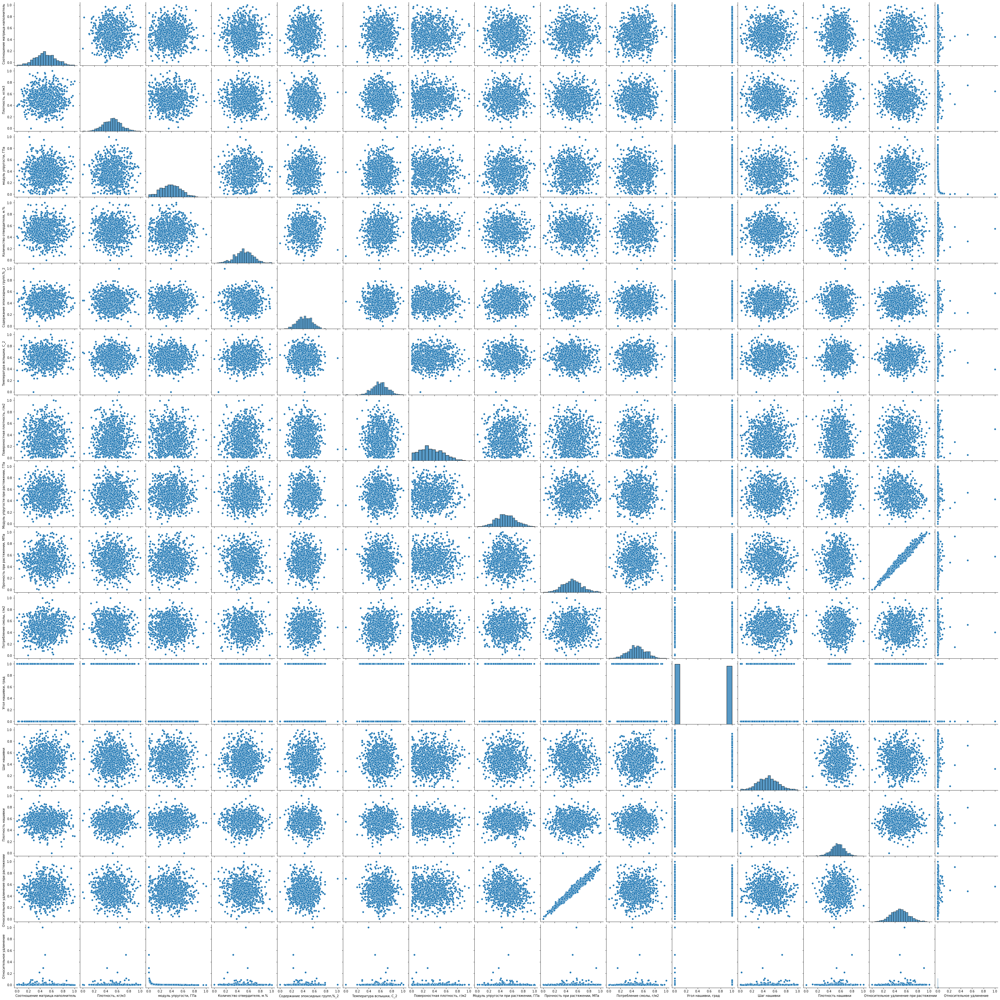

In [61]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [62]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его исключаем 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_dnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.276998,0.548135,0.704292,0.002917
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.576985,0.704292,0.002917
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.673149,0.704292,0.002917
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.346248,0.451971,0.704292,0.002917
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.346248,0.548135,0.704292,0.002847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.462855,0.476884,0.382158,0.313057,0.717503,0.149109,0.485125,0.480312,0.239516,0.628535,0.452161,0.463008,0.001591
1019,0.587163,0.668737,0.231678,0.707685,0.285131,0.492271,0.250230,0.475992,0.470745,0.220404,0.731664,0.516890,0.456081,0.004061
1020,0.555750,0.505470,0.217065,0.512067,0.517605,0.473781,0.528643,0.573346,0.578340,0.532590,0.288158,0.650355,0.533290,0.005053
1021,0.637396,0.703842,0.387114,0.682389,0.266309,0.561107,0.458108,0.536217,0.368070,0.428909,0.437186,0.560262,0.352204,0.001755


###### Оценка корреляции параметров датасета после нормализации

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [63]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.278
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.550
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.710
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.372
Относительное удлинение : 	 	 	Statistics=0.078, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: нормализации по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Плотность нашивки', 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

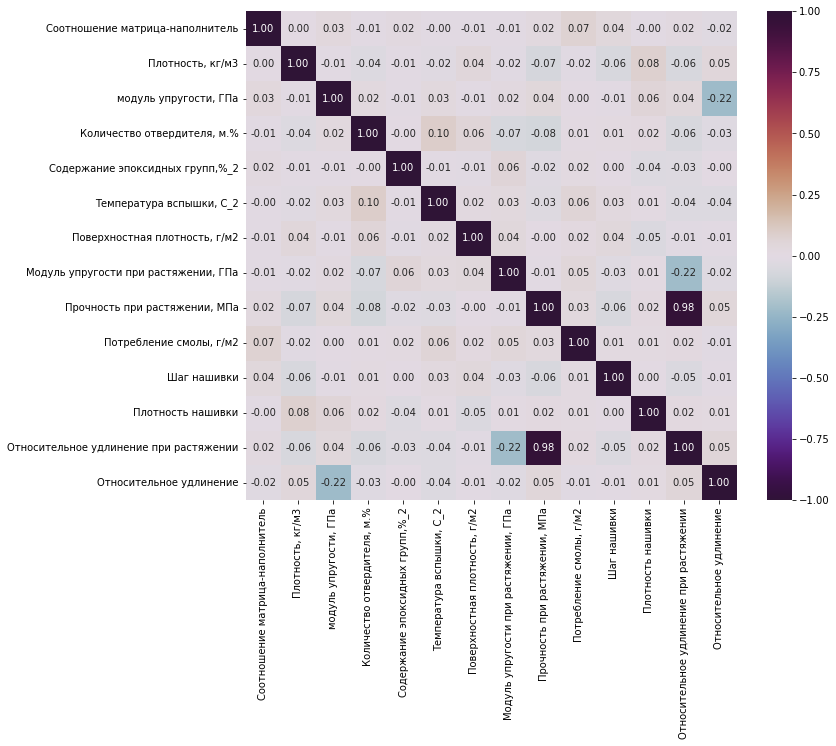

In [64]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05/

In [65]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col], df_dnorm[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.073, p-value=0.020





2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.062, p-value=0.046


3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.223, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.095, p-value=0.002


Наименование колонок и строк С 

Статистически значимыми по критерию Пирсона являются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

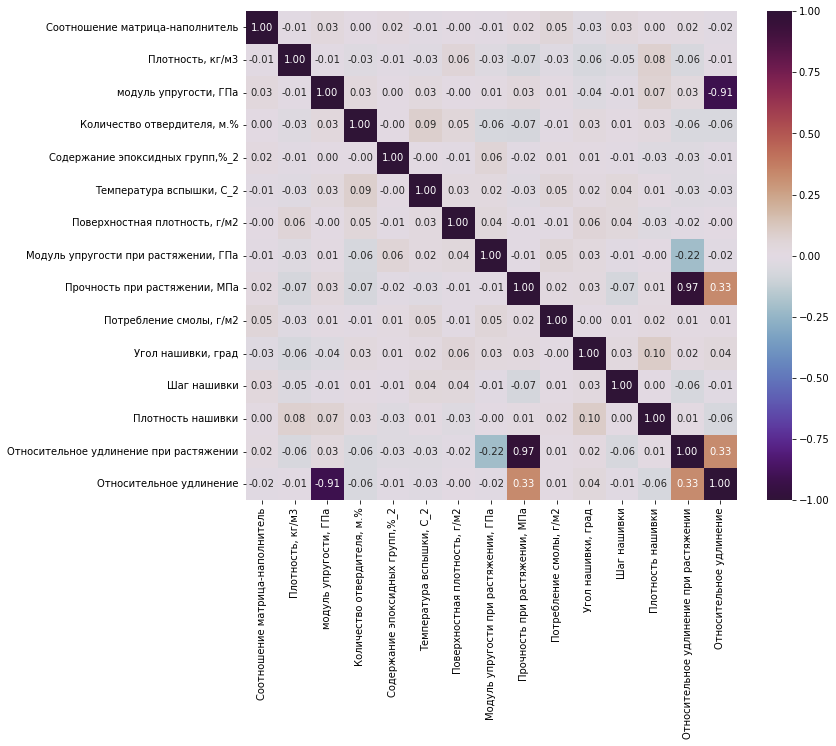

In [66]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [67]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_norm.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_norm['Угол нашивки, град'] , df_norm[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.019, p-value=0.553
Относительное удлинение : 	 	 	Statistics=0.037, p-value=0.243

Наименование колонок,

Вывод: согласно критерию Спирмена корреляция тех же самых параметров и после нормализации статистически значима 

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Плотность нашивки', 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих парметров между собой и с остальными параметрами следует проверять по критерию Спирмена:


In [68]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[col], df_norm[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель















2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010



3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.911, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердит

Вывод: кроме того, для параметров 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Плотность нашивки', 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.332, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.101, p-value=0.001
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.063, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.327, p-value=0.000

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ: судя по матрицам корреляции, построенным на основании корреляции по Пирсону для количественных данных и Спирмена для количественных и категориальных данных, коэффициенты корреляции после нормализации параметров мало изменились, следует разбить датасет на несколько частей и проанализировать каждую часть отдельно

###### Разбиение датасета на части и проверка значимости корреляций в каждой части датасета

In [69]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Шаг нашивки                             1023 non-null   floa

In [70]:
# 1-ая часть датасета
df_dnorm[0:255].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.276998,0.548135,0.704292,0.002917
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.576985,0.704292,0.002917
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.673149,0.704292,0.002917
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.346248,0.451971,0.704292,0.002917
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.346248,0.548135,0.704292,0.002847


In [71]:
# 2-ая часть датасета
df_dnorm[256:511].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
256,0.715605,0.652937,0.064689,0.323390,0.527684,0.730719,0.526863,0.411221,0.240426,0.434049,0.611530,0.531840,0.255269,0.011672
257,0.507054,0.477400,0.478762,0.000000,0.411340,0.573041,0.363353,0.548893,0.756980,0.556437,0.396231,0.684427,0.698489,0.002360
258,0.483817,0.590994,0.516792,0.498159,0.432951,0.507518,0.023060,0.380721,0.930999,0.694061,0.497303,0.484171,0.905647,0.002581
259,0.316556,0.820944,0.532819,0.600525,0.276543,0.577245,0.371311,0.641672,0.125194,0.290125,0.209177,0.547873,0.122465,0.000441
260,0.817485,0.345434,0.303105,0.759185,0.553422,0.669624,0.371644,0.333474,0.933138,0.392532,0.206266,0.575776,0.922900,0.004971


In [72]:
# 3-ья часть датасета
df_dnorm[512:767].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
512,0.463091,0.262900,0.717035,0.460593,0.215571,0.643760,0.429768,0.530433,0.777175,0.387291,0.604482,0.278602,0.721355,0.001347
513,0.351801,0.531952,0.607546,0.559578,0.723296,0.779945,0.349991,0.591327,0.520559,0.510050,0.843376,0.440046,0.478312,0.001165
514,0.259257,0.413871,0.782196,0.412373,0.487721,0.801118,0.650923,0.467266,0.483090,0.568885,0.727947,0.511944,0.469083,0.000660
515,0.418610,0.581273,0.666292,0.341558,0.329056,0.549080,0.029104,0.210337,0.498095,0.383561,0.709590,0.629326,0.538627,0.000946
516,0.773831,0.155399,0.599577,0.821520,0.226392,0.680532,0.533499,0.346499,0.812678,0.403951,0.606180,0.481773,0.804977,0.001848


In [73]:
# 4-ая часть датасета
df_dnorm[768:1023].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
768,0.622537,0.319406,0.069536,0.517326,0.423186,0.554153,0.606672,0.422038,0.640532,0.686548,0.574871,0.420308,0.623883,0.018454
769,0.790930,0.347952,0.365464,0.893455,0.293538,0.667234,0.240386,0.210970,0.380123,0.673632,0.546348,0.553937,0.423014,0.001950
770,0.462724,0.579743,0.949887,0.548650,0.503259,0.641338,0.485352,0.830178,0.734869,0.383775,0.353777,0.531084,0.613536,0.000759
771,0.551449,0.388865,0.671079,0.179170,0.281578,0.608304,0.166636,0.442089,0.647077,0.612882,0.575893,0.617324,0.625083,0.001233
772,0.646002,0.675209,0.361264,0.658326,0.423468,0.707788,0.364773,0.477588,0.476240,0.610749,0.574278,0.598444,0.460782,0.002341


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [74]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:255].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:255][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.993, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.613
модуль упругости, ГПа : 	 	 	Statistics=0.990, p-value=0.081
Количество отвердителя, м.% : 	 	 	Statistics=0.985, p-value=0.009
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.986, p-value=0.011
Температура вспышки, С_2 : 	 	 	Statistics=0.986, p-value=0.012
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.972, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.992, p-value=0.218
Прочность при растяжении, МПа : 	 	 	Statistics=0.992, p-value=0.212
Потребление смолы, г/м2 : 	 	 	Statistics=0.988, p-value=0.038
Шаг нашивки : 	 	 	Statistics=0.993, p-value=0.294
Плотность нашивки : 	 	 	Statistics=0.990, p-value=0.088
Относительное удлинение при растяжении : 	 	 	Statistics=0.993, p-value=0.267
Относительное удлинение : 	 	 	Statistics=0.185, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [75]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[256:511].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[256:511][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.996, p-value=0.823
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.879
модуль упругости, ГПа : 	 	 	Statistics=0.993, p-value=0.264
Количество отвердителя, м.% : 	 	 	Statistics=0.994, p-value=0.452
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.292
Температура вспышки, С_2 : 	 	 	Statistics=0.993, p-value=0.255
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.970, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.356
Прочность при растяжении, МПа : 	 	 	Statistics=0.995, p-value=0.512
Потребление смолы, г/м2 : 	 	 	Statistics=0.994, p-value=0.359
Шаг нашивки : 	 	 	Statistics=0.993, p-value=0.265
Плотность нашивки : 	 	 	Statistics=0.997, p-value=0.849
Относительное удлинение при растяжении : 	 	 	Statistics=0.996, p-value=0.771
Относительное удлинение : 	 	 	Statistics=0.101, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [76]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[512:767].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[512:767][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.418
Плотность, кг/м3 : 	 	 	Statistics=0.993, p-value=0.257
модуль упругости, ГПа : 	 	 	Statistics=0.989, p-value=0.056
Количество отвердителя, м.% : 	 	 	Statistics=0.997, p-value=0.881
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.992, p-value=0.151
Температура вспышки, С_2 : 	 	 	Statistics=0.996, p-value=0.816
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.970, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.391
Прочность при растяжении, МПа : 	 	 	Statistics=0.995, p-value=0.544
Потребление смолы, г/м2 : 	 	 	Statistics=0.993, p-value=0.303
Шаг нашивки : 	 	 	Statistics=0.990, p-value=0.071
Плотность нашивки : 	 	 	Statistics=0.990, p-value=0.081
Относительное удлинение при растяжении : 	 	 	Statistics=0.996, p-value=0.764
Относительное удлинение : 	 	 	Statistics=0.082, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [77]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[768:1023].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[768:1023][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.373
Плотность, кг/м3 : 	 	 	Statistics=0.994, p-value=0.339
модуль упругости, ГПа : 	 	 	Statistics=0.991, p-value=0.104
Количество отвердителя, м.% : 	 	 	Statistics=0.997, p-value=0.896
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.242
Температура вспышки, С_2 : 	 	 	Statistics=0.996, p-value=0.813
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.976, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.358
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.434
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.745
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.998
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.312
Относительное удлинение при растяжении : 	 	 	Statistics=0.992, p-value=0.165
Относительное удлинение : 	 	 	Statistics=0.385, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: при рассмотрении отдельных частей датасета установлено, что:

параметры 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2', 'Относительное удлинение' в 1-ой части датасета, 

параметры 'Поверхностная плотность, г/м2', 'Относительное удлинение' во всех трех остальных частях датасета

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [78]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:255][col])
    df2=np.array(df_dnorm[256:511][col])
    df3=np.array(df_dnorm[512:767][col])
    df4=np.array(df_dnorm[768:1023][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.947, p-value=0.814
Плотность, кг/м3 : 	 	 	Statistics=4.523, p-value=0.210
модуль упругости, ГПа : 	 	 	Statistics=2.978, p-value=0.395
Количество отвердителя, м.% : 	 	 	Statistics=6.167, p-value=0.104
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=2.883, p-value=0.410
Температура вспышки, С_2 : 	 	 	Statistics=6.337, p-value=0.096
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.870, p-value=0.833
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=2.550, p-value=0.466
Прочность при растяжении, МПа : 	 	 	Statistics=1.220, p-value=0.748
Потребление смолы, г/м2 : 	 	 	Statistics=1.038, p-value=0.792
Шаг нашивки : 	 	 	Statistics=1.195, p-value=0.754
Плотность нашивки : 	 	 	Statistics=7.410, p-value=0.060
Относительное удлинение при растяжении : 	 	 	Statistics=1.043, p-value=0.791
Относительное удлинение : 	 	 	Statistics=2.640, p-value=0.450

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [79]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:255].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[256:511].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[512:767].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[768:1023].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.960, p-value=0.581
Плотность, кг/м3 : 	 	 	Statistics=3.621, p-value=0.305
модуль упругости, ГПа : 	 	 	Statistics=0.671, p-value=0.880
Количество отвердителя, м.% : 	 	 	Statistics=4.181, p-value=0.243
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=3.433, p-value=0.330
Температура вспышки, С_2 : 	 	 	Statistics=3.965, p-value=0.265
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.689, p-value=0.876
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.282, p-value=0.350
Прочность при растяжении, МПа : 	 	 	Statistics=1.028, p-value=0.794
Потребление смолы, г/м2 : 	 	 	Statistics=1.000, p-value=0.801
Шаг нашивки : 	 	 	Statistics=0.435, p-value=0.933
Плотность нашивки : 	 	 	Statistics=5.748, p-value=0.125
Относительное удлинение при растяжении : 	 	 	Statistics=0.426, p-value=0.935
Относительное удлинение : 	 	 	Statistics=1.584, p-value=0.663

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: сравнение датасетов по столбцам показывает, что отличие групп статистически незначимо

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [80]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:255][col])
    df2=np.array(df_dnorm[256:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.802
Плотность, кг/м3 : 	 	 	Statistics=0.042, p-value=0.868
модуль упругости, ГПа : 	 	 	Statistics=0.093, p-value=0.065
Количество отвердителя, м.% : 	 	 	Statistics=0.087, p-value=0.104
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.070, p-value=0.291
Температура вспышки, С_2 : 	 	 	Statistics=0.094, p-value=0.062
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.055, p-value=0.580
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.093, p-value=0.067
Прочность при растяжении, МПа : 	 	 	Statistics=0.060, p-value=0.469
Потребление смолы, г/м2 : 	 	 	Statistics=0.064, p-value=0.389
Шаг нашивки : 	 	 	Statistics=0.067, p-value=0.343
Плотность нашивки : 	 	 	Statistics=0.160, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.054, p-value=0.616
Относительное удлинение : 	 	 	Statistics=0.058, p-value=0.518

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [81]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[256:511][col])
    df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.815
Плотность, кг/м3 : 	 	 	Statistics=0.084, p-value=0.123
модуль упругости, ГПа : 	 	 	Statistics=0.061, p-value=0.446
Количество отвердителя, м.% : 	 	 	Statistics=0.091, p-value=0.080


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.076, p-value=0.206
Температура вспышки, С_2 : 	 	 	Statistics=0.104, p-value=0.030
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.061, p-value=0.464
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.058, p-value=0.525
Прочность при растяжении, МПа : 	 	 	Statistics=0.057, p-value=0.551
Потребление смолы, г/м2 : 	 	 	Statistics=0.033, p-value=0.981
Шаг нашивки : 	 	 	Statistics=0.079, p-value=0.178
Плотность нашивки : 	 	 	Statistics=0.136, p-value=0.002
Относительное удлинение при растяжении : 	 	 	Statistics=0.050, p-value=0.701
Относительное удлинение : 	 	 	Statistics=0.053, p-value=0.632

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'П

C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\3076635215.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:255].append(df_dnorm[512:],sort=False)[col])


In [82]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[512:767][col])
    df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.053, p-value=0.638
Плотность, кг/м3 : 	 	 	Statistics=0.069, p-value=0.300
модуль упругости, ГПа : 	 	 	Statistics=0.065, p-value=0.367
Количество отвердителя, м.% : 	 	 	Statistics=0.050, p-value=0.695
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.054, p-value=0.615
Температура вспышки, С_2 : 	 	 	Statistics=0.076, p-value=0.208
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.057, p-value=0.537
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.073, p-value=0.245


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Прочность при растяжении, МПа : 	 	 	Statistics=0.041, p-value=0.896
Потребление смолы, г/м2 : 	 	 	Statistics=0.049, p-value=0.726
Шаг нашивки : 	 	 	Statistics=0.055, p-value=0.588
Плотность нашивки : 	 	 	Statistics=0.141, p-value=0.001


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Относительное удлинение при растяжении : 	 	 	Statistics=0.037, p-value=0.943
Относительное удлинение : 	 	 	Statistics=0.050, p-value=0.704

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : ['Плотность нашивки']


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\1183347517.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:511].append(df_dnorm[768:],sort=False)[col])


In [83]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:767][col])
    df2=np.array(df_dnorm[768:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.047, p-value=0.763
Плотность, кг/м3 : 	 	 	Statistics=0.081, p-value=0.152
модуль упругости, ГПа : 	 	 	Statistics=0.079, p-value=0.174
Количество отвердителя, м.% : 	 	 	Statistics=0.064, p-value=0.387
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.056, p-value=0.566
Температура вспышки, С_2 : 	 	 	Statistics=0.080, p-value=0.160
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.058, p-value=0.507
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.039, p-value=0.922
Прочность при растяжении, МПа : 	 	 	Statistics=0.063, p-value=0.404
Потребление смолы, г/м2 : 	 	 	Statistics=0.068, p-value=0.325
Шаг нашивки : 	 	 	Statistics=0.058, p-value=0.515
Плотность нашивки : 	 	 	Statistics=0.147, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.074, p-value=0.236
Относительное удлинение : 	 	 	Statistics=0.065, p-value=0.378

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: попарное различие групп по непараметрическому критерию Колмогорова-Смирнова наблюдается по параметру 'Плотность нашивки'

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [84]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:255][col])
    df2=np.array(df_dnorm[256:511][col])
    df3=np.array(df_dnorm[512:767][col])
    df4=np.array(df_dnorm[768:1023][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=2.877, p-value=0.411
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.449, p-value=0.718
Плотность, кг/м3 : 	 	 	Statistics Bartlet=6.094, p-value=0.107
Плотность, кг/м3 : 	 	 	Statistics F-test=1.838, p-value=0.139
модуль упругости, ГПа : 	 	 	Statistics Bartlet=9.778, p-value=0.021
модуль упругости, ГПа : 	 	 	Statistics F-test=1.306, p-value=0.271
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=2.655, p-value=0.448
Количество отвердителя, м.% : 	 	 	Statistics F-test=1.810, p-value=0.144
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=0.574, p-value=0.902
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.741, p-value=0.528
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=2.085, p-value=0.555
Температура вспышки, С_2 : 	 	 	Statistics F-test=2.100, p-value=0.099
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=2.914, p-value=0.405
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: дисперсии статистически не различаются по рассматриваемым группам

Корреляционные матрицы для частей датасета:

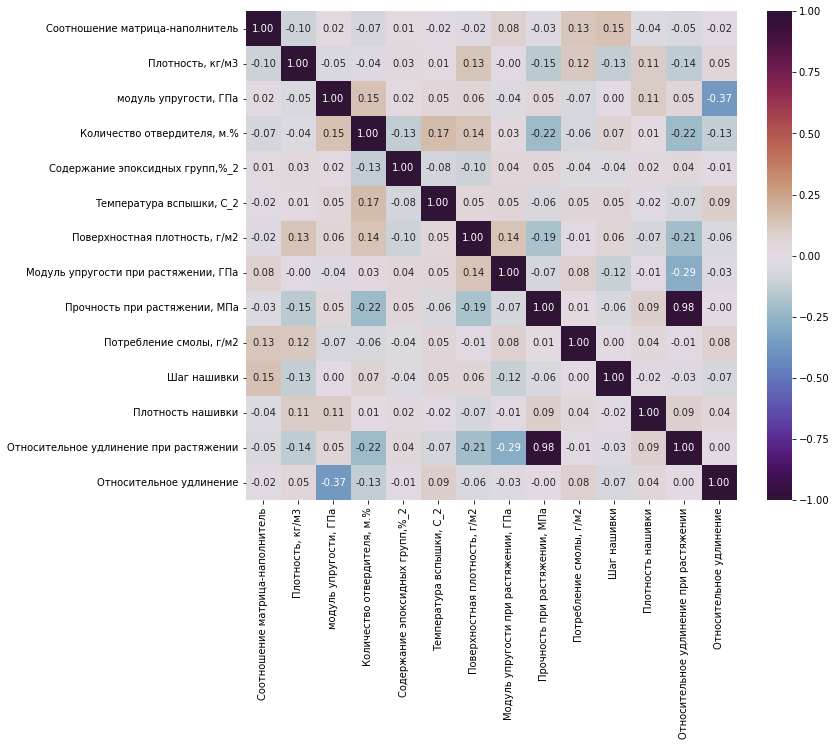

In [85]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:255].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [86]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:255].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:255].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:255], df_dnorm[col1][0:255]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.129, p-value=0.040

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.147, p-value=0.019




2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.134, p-value=0.033


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.145, p-value=0.020


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.127, p-value=0.042


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.136, p-value=0.030


3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердит

Выводы: статистически значимыми по критерию Пирсона после разбивки для 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.129, p-value=0.040
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.147, p-value=0.019
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.134, p-value=0.033
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.145, p-value=0.020
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.127, p-value=0.042
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.136, p-value=0.030
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.147, p-value=0.019
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.366, p-value=0.000
    Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : Statistics=-0.131, p-value=0.037
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.168, p-value=0.007
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.139, p-value=0.026
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.220, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.222, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.127, p-value=0.043
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.141, p-value=0.025
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.190, p-value=0.002
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.211, p-value=0.001
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.286, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000
    
или:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.129, p-value=0.040
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.147, p-value=0.019
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.134, p-value=0.033
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.145, p-value=0.020
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.127, p-value=0.042
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.147, p-value=0.019
    Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : Statistics=-0.131, p-value=0.037
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.168, p-value=0.007
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.139, p-value=0.026
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.220, p-value=0.000
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.141, p-value=0.025
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.190, p-value=0.002

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

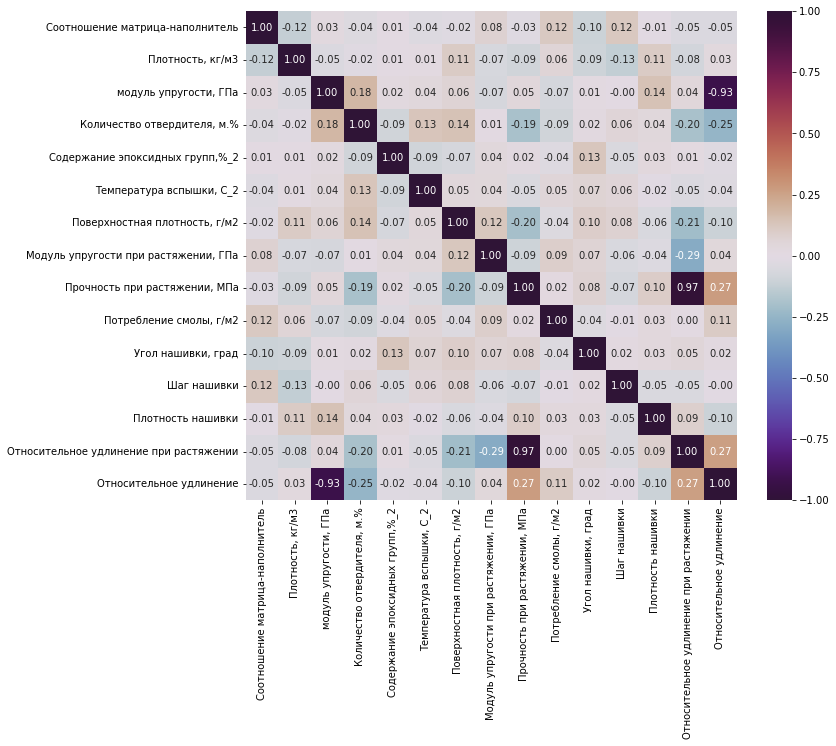

In [87]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:255]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [88]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:255].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:255].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:255][col], df_norm[0:255][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Плотность, кг/м3 : 		 
Statistics=-0.124, p-value=0.048














2
Плотность, кг/м3










Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.126, p-value=0.044




3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.182, p-value=0.004









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.144, p-value=0.022


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.925, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.131, p-value=0.037

Наименование колонок и строк С корреляцией: 
Количество

Вывод: в 1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Плотность, кг/м3 : Statistics=-0.124, p-value=0.048
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.126, p-value=0.044
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.182, p-value=0.004
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.144, p-value=0.022
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.925, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.131, p-value=0.037
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.143, p-value=0.023
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.194, p-value=0.002
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.196, p-value=0.002
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.249, p-value=0.000
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.126, p-value=0.044
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.124, p-value=0.048
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.204, p-value=0.001
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.213, p-value=0.001
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.293, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.973, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.272, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.265, p-value=0.000

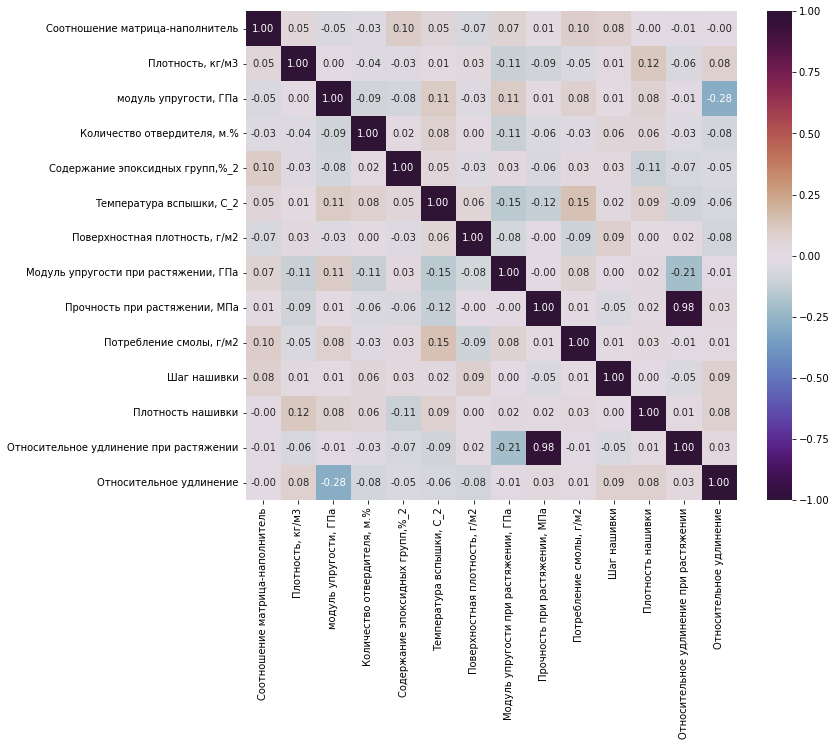

In [89]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[256:511].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [90]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[256:511].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[256:511].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][256:511], df_dnorm[col1][256:511]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.283, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.149, p-value=0.018


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.149, p-value=0.018





7
Поверхностная плотность, г/м2








8
Модуль упругости при растяжении, ГПа





Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : 		 
Statistics=-0.207, p-value=0.001


9
Прочность при растяжении, МПа




Наименование колонок и строк С корреляцией: 
Прочность п

Выводы: статистически значимыми по критерию Пирсона после разбивки для 2-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.283, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.149, p-value=0.018
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.149, p-value=0.018
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.207, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.978, p-value=0.000
    
или:

    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.149, p-value=0.018
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.149, p-value=0.018

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

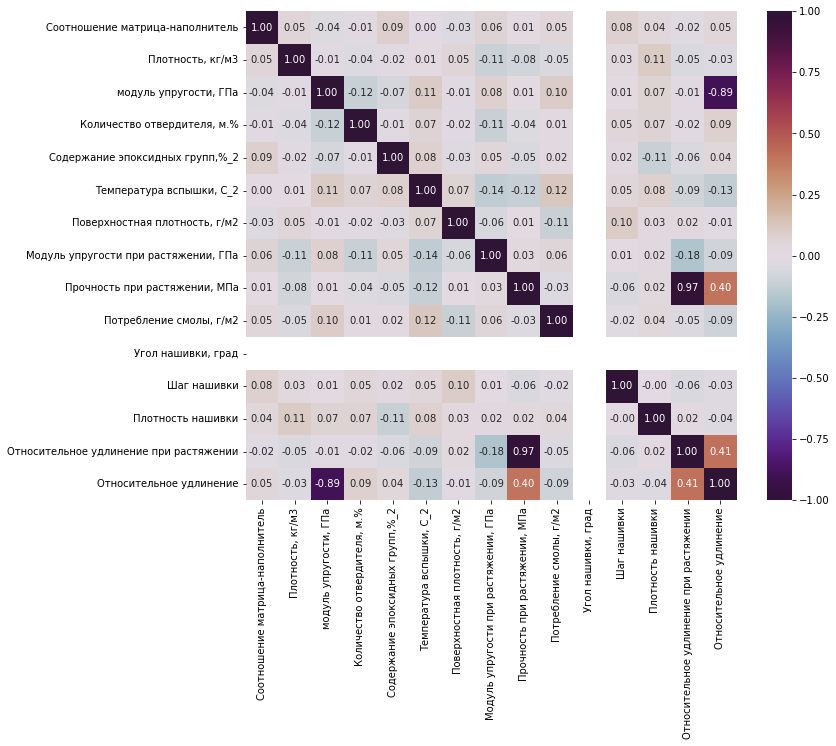

In [91]:
# Матрица корреляции по Спирмену
df2 = df_norm[256:511]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [92]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[256:511].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[256:511].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[256:511][col], df_norm[256:511][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.889, p-value=0.000

4
Количество отвердителя, м.%







Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





5
Содержание эпоксидных групп,%_2






Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





6
Температура вспы

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.889, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.135, p-value=0.031
    Температура вспышки, С_2  &  Относительное удлинение : Statistics=-0.133, p-value=0.034
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.177, p-value=0.005
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.402, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.409, p-value=0.000   

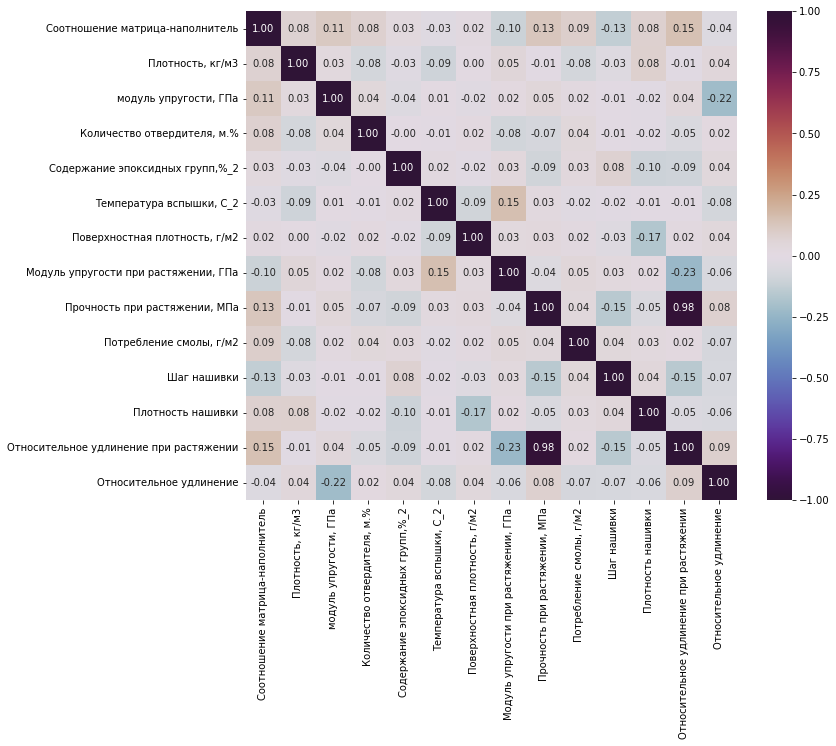

In [93]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[512:767].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [94]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[512:767].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[512:767].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][512:767], df_dnorm[col1][512:767]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель








Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=0.129, p-value=0.040


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=-0.129, p-value=0.040


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=0.147, p-value=0.019


2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.219, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.153, p-value=0.014







7
Поверхностная плотность, г/м2





Наи

Выводы: статистически значимыми по критерию Пирсона после разбивки для 3-ьей четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.129, p-value=0.040
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=-0.129, p-value=0.040
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=0.147, p-value=0.019
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.219, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.153, p-value=0.014
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.169, p-value=0.007
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.234, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.150, p-value=0.016
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.980, p-value=0.000
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.153, p-value=0.015
    
или:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.129, p-value=0.040
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=-0.129, p-value=0.040
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.153, p-value=0.014
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.169, p-value=0.007
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.150, p-value=0.016

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

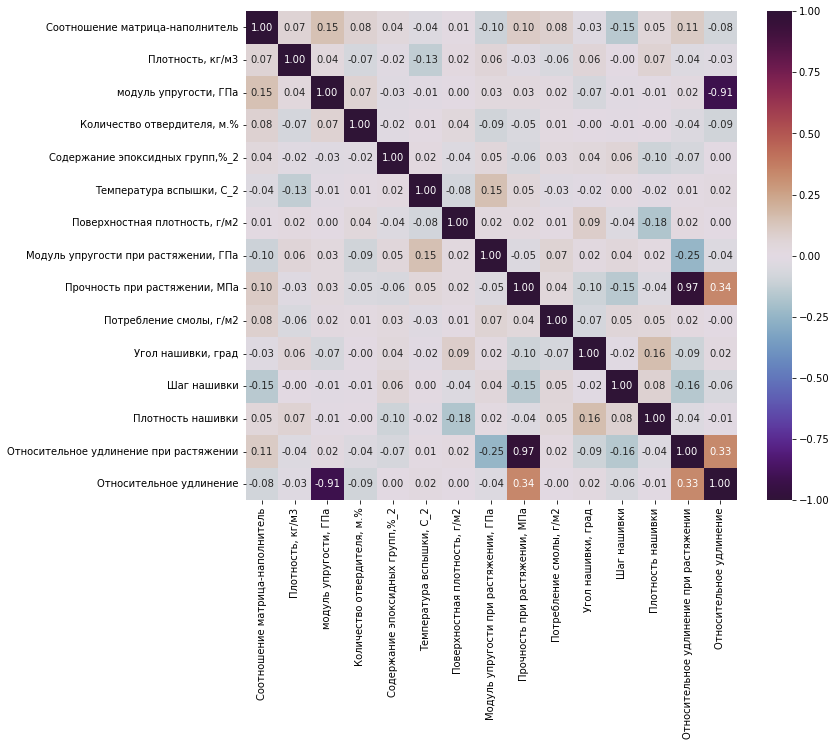

In [95]:
# Матрица корреляции по Спирмену
df3 = df_norm[512:767]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [96]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[512:767].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[512:767].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[512:767][col], df_norm[512:767][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.146, p-value=0.019









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=-0.150, p-value=0.016




2
Плотность, кг/м3




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Температура вспышки, С_2 : 		 
Statistics=-0.133, p-value=0.034










3
модуль упругости, ГПа












Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.914, p-value=0.000

4
Количество отвердителя, м.%












5
Содержание эпоксидных групп,%_2











6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.150, p-value=0.017








7
Поверхностная плотность, г/м2






Наименование колонок и строк С к

Вывод: в 3-ьей части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.146, p-value=0.019
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=-0.150, p-value=0.016
    Плотность, кг/м3  &  Температура вспышки, С_2 : Statistics=-0.133, p-value=0.034
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.914, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.150, p-value=0.017
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.175, p-value=0.005
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.246, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.153, p-value=0.015
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.338, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.160, p-value=0.011
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.159, p-value=0.011
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.335, p-value=0.000

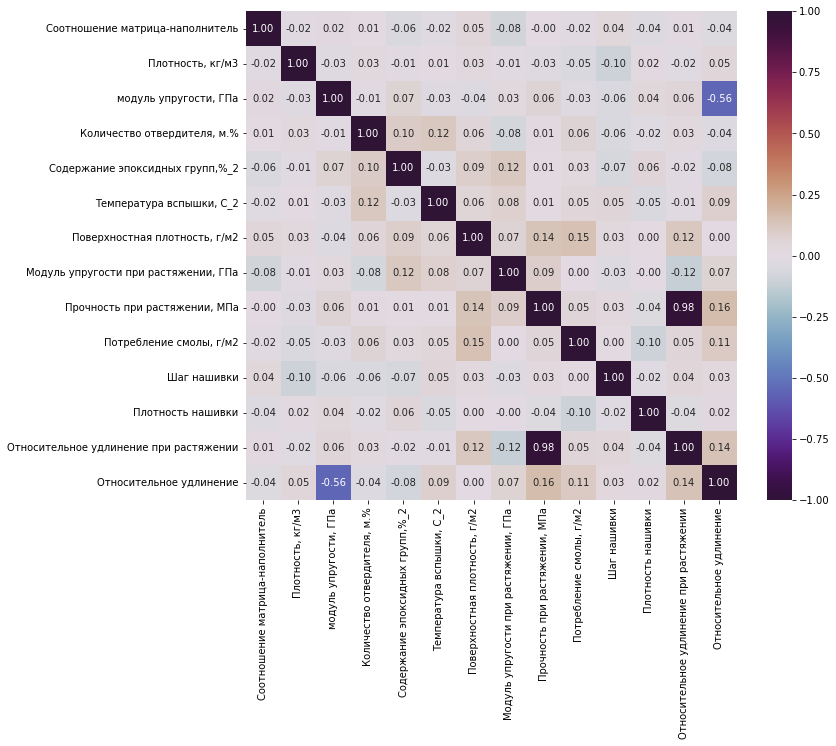

In [97]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[768:1023].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [98]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[768:1023].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[768:1023].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][768:1023], df_dnorm[col1][768:1023]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.555, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2









7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=0.135, p-value=0.031

Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : 		 
Statistics=0.147, p-value=0.019





8
Модуль упругости при растяжении, ГПа







9
Прочность при растяжении, МПа




Наименование колонок и строк С корреляцией: 
Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : 		 
Statistics=0.976, p-value=0.000

Наименование колонок и строк С корреляцией: 
Прочность при ра

Выводы: статистически значимыми по критерию Пирсона после разбивки для 4-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.555, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.135, p-value=0.031
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.147, p-value=0.019
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.163, p-value=0.009
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.145, p-value=0.021
    
или:


    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.135, p-value=0.031
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.147, p-value=0.019

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

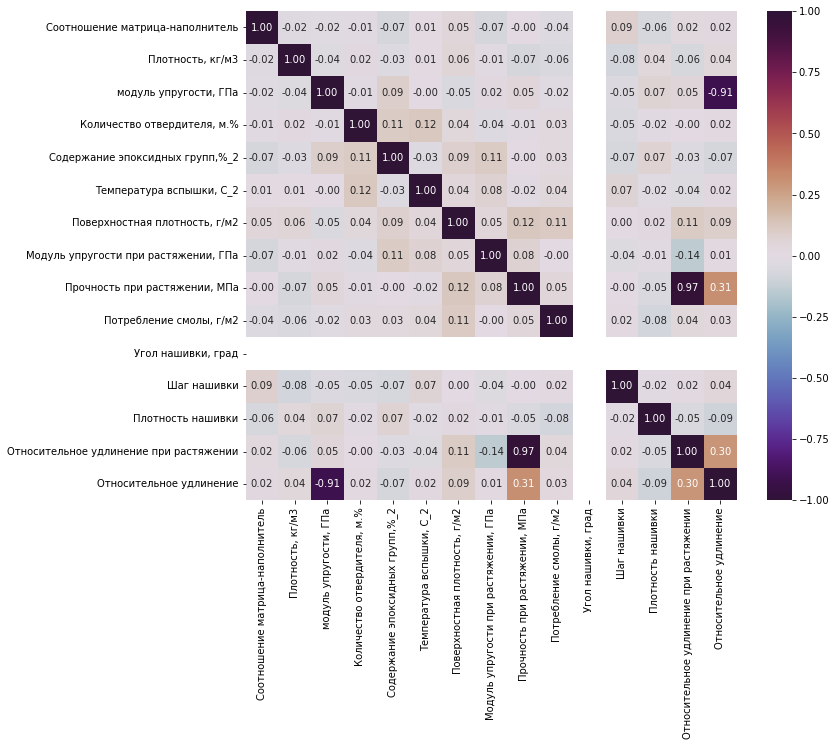

In [99]:
# Матрица корреляции по Спирмену
df4 = df_norm[768:1023]
corr = df4.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [100]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[768:1023].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[768:1023].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[768:1023][col], df_norm[768:1023][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.911, p-value=0.000

4
Количество отвердителя, м.%







Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





5
Содержание эпоксидных групп,%_2






Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





6
Температура вспы

Вывод: в 4-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.124, p-value=0.048
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.137, p-value=0.028
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.970, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.314, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.297, p-value=0.000

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ ДАТАСЕТА, РАЗБИТОГО НА 4 РАВНЫЕ ЧАСТИ: именно для 1-ой части датасета произошло заметное изменение значимости параметров и увеличение числа значимых параметров, а также увеличение некоторых коэффициентов корреляции в корреляционной матрице, отсюда можно сделать вывод, что, вероятно, в 1-ой четверти датасета находится статистически значимая часть датасета

ОБЩИЙ ВЫВОД ПО ПРЕДВАРИТЕЛЬНОЙ ОБРАБОТКЕ ДАТАСЕТА: Методами статистического анализа в общем целом датасете не удалось выяснить связей между исходными параметрами датасета. Данные датасета представляют собой в значительной мере случайные числа с нормальным распределением, кроме значений углов нашивки в 'Угол нашивки, град'. Статистически отличаются от нормального распределения параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки'.

Не удалось выяснить в общем датасете также заметные связи между данными из двух разных файлов 'X_bp.xlsx' и 'X_nup.xlsx'. Соответствие между данными из этих двух файлов вероятно является произвольным.

Показатель R-квадрат рассмотренных линейных моделей регрессии без учета расчетных параметров 'Относительное удлинение при растяжении' и 'Относительное удлинение' максимально имеет величину не более 0,03, что указывает на низкое качество моделей, которые выдают результат близкий к средним значениям.

Был сделан ОБЩИЙ ВЫВОД, что данные включают в себя значительное количество сгенерированных чисел с нормальным распределением

ДОПОЛНЕНИЕ № 1: разрезание 1-ой части датасета еще на четыре части

In [101]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Шаг нашивки                             1023 non-null   floa

In [102]:
# 1_1-ая часть датасета
df_dnorm[0:63].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.276998,0.548135,0.704292,0.002917
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.576985,0.704292,0.002917
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.673149,0.704292,0.002917
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.346248,0.451971,0.704292,0.002917
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.346248,0.548135,0.704292,0.002847


In [103]:
# 1_2-ая часть датасета
df_dnorm[64:127].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
64,0.417603,0.472308,0.214092,0.367240,0.647152,0.526581,0.480194,0.324717,0.699905,0.422939,0.428747,0.305842,0.704389,0.005897
65,0.252923,0.550115,0.174143,0.539377,0.544473,0.645917,0.120088,0.522177,0.209087,0.655184,0.538949,0.525381,0.211171,0.003643
66,0.773644,0.594230,0.316707,0.476553,0.348020,0.407035,0.467458,0.697473,0.428445,0.649884,0.914026,0.638174,0.378528,0.002579
67,0.588854,0.286936,0.300700,0.384336,0.483725,0.610773,0.241850,0.512119,0.683267,0.512382,0.351986,0.484723,0.641228,0.003899
68,0.440674,0.234067,0.619955,0.491596,0.270883,0.703421,0.053352,0.384420,0.832440,0.154009,0.735630,0.457258,0.812382,0.001804


In [104]:
# 1_3-ья часть датасета
df_dnorm[128:191].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
128,0.472643,0.487600,0.564410,0.668459,0.457650,0.620845,0.039699,0.249516,0.575692,0.531808,0.496847,0.472749,0.604768,0.001447
129,0.260855,0.323438,0.358196,0.490938,0.337189,0.521470,0.129828,0.700067,0.472311,0.584263,0.341373,0.368171,0.415957,0.002353
130,0.579039,0.406923,0.301286,0.632671,0.486461,0.581426,0.429782,0.459970,0.347769,0.374238,0.620814,0.641604,0.346553,0.002391
131,0.455106,0.534374,0.348867,0.471468,0.393321,0.635374,0.609030,0.652783,0.679001,0.551549,0.157318,0.439603,0.604801,0.003235
132,0.495551,0.536594,0.218135,0.582789,0.258805,0.656655,0.402714,0.414169,0.504890,0.489487,0.310781,0.438124,0.500031,0.004572


In [105]:
# 1_4-ая часть датасета
df_dnorm[192:255].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
192,0.202231,0.530200,0.567836,0.497745,0.375439,0.638179,0.381138,0.564334,0.488152,0.582453,0.564205,0.366885,0.454708,0.001226
193,0.376520,0.415775,0.220045,0.480083,0.500953,0.656932,0.395946,0.664707,0.782962,0.628622,0.692008,0.893975,0.692644,0.006224
194,0.297787,0.591334,0.085343,0.646312,0.481668,0.574976,0.244512,0.555663,0.398285,0.495017,0.484693,0.567230,0.376001,0.011159
195,0.504311,0.498092,0.639364,0.556040,0.388617,0.803317,0.200684,0.355375,0.429997,0.482364,0.406578,0.460388,0.442071,0.000876
196,0.590191,0.357952,0.552500,0.508230,0.330204,0.378619,0.009843,0.127067,0.530386,0.274008,0.291871,0.536276,0.590794,0.001385


In [106]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:63].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:63][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.975, p-value=0.230
Плотность, кг/м3 : 	 	 	Statistics=0.989, p-value=0.853
модуль упругости, ГПа : 	 	 	Statistics=0.962, p-value=0.048
Количество отвердителя, м.% : 	 	 	Statistics=0.927, p-value=0.001
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.898, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics=0.885, p-value=0.000
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.932, p-value=0.002
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.980, p-value=0.397
Прочность при растяжении, МПа : 	 	 	Statistics=0.981, p-value=0.432
Потребление смолы, г/м2 : 	 	 	Statistics=0.945, p-value=0.007
Шаг нашивки : 	 	 	Statistics=0.940, p-value=0.004
Плотность нашивки : 	 	 	Statistics=0.886, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.965, p-value=0.072
Относительное удлинение : 	 	 	Statistics=0.886, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [107]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[64:127].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[64:127][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.991, p-value=0.932
Плотность, кг/м3 : 	 	 	Statistics=0.979, p-value=0.374
модуль упругости, ГПа : 	 	 	Statistics=0.961, p-value=0.045
Количество отвердителя, м.% : 	 	 	Statistics=0.990, p-value=0.894
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.990, p-value=0.877
Температура вспышки, С_2 : 	 	 	Statistics=0.982, p-value=0.505
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.949, p-value=0.011
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.974, p-value=0.204
Прочность при растяжении, МПа : 	 	 	Statistics=0.988, p-value=0.786
Потребление смолы, г/м2 : 	 	 	Statistics=0.958, p-value=0.029
Шаг нашивки : 	 	 	Statistics=0.988, p-value=0.818
Плотность нашивки : 	 	 	Statistics=0.982, p-value=0.468
Относительное удлинение при растяжении : 	 	 	Statistics=0.981, p-value=0.432
Относительное удлинение : 	 	 	Statistics=0.216, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [108]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[128:191].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[128:191][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.992, p-value=0.965
Плотность, кг/м3 : 	 	 	Statistics=0.987, p-value=0.768
модуль упругости, ГПа : 	 	 	Statistics=0.988, p-value=0.804
Количество отвердителя, м.% : 	 	 	Statistics=0.980, p-value=0.414
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.986, p-value=0.683
Температура вспышки, С_2 : 	 	 	Statistics=0.977, p-value=0.284
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.981, p-value=0.450
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.978, p-value=0.317
Прочность при растяжении, МПа : 	 	 	Statistics=0.966, p-value=0.083
Потребление смолы, г/м2 : 	 	 	Statistics=0.979, p-value=0.367
Шаг нашивки : 	 	 	Statistics=0.976, p-value=0.249
Плотность нашивки : 	 	 	Statistics=0.970, p-value=0.127
Относительное удлинение при растяжении : 	 	 	Statistics=0.975, p-value=0.229
Относительное удлинение : 	 	 	Statistics=0.220, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [109]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[192:255].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[192:255][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.978, p-value=0.302
Плотность, кг/м3 : 	 	 	Statistics=0.975, p-value=0.216
модуль упругости, ГПа : 	 	 	Statistics=0.973, p-value=0.174
Количество отвердителя, м.% : 	 	 	Statistics=0.965, p-value=0.067
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.984, p-value=0.609
Температура вспышки, С_2 : 	 	 	Statistics=0.982, p-value=0.492
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.325
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.976, p-value=0.259
Прочность при растяжении, МПа : 	 	 	Statistics=0.976, p-value=0.248
Потребление смолы, г/м2 : 	 	 	Statistics=0.976, p-value=0.254
Шаг нашивки : 	 	 	Statistics=0.983, p-value=0.547
Плотность нашивки : 	 	 	Statistics=0.990, p-value=0.885
Относительное удлинение при растяжении : 	 	 	Statistics=0.981, p-value=0.454
Относительное удлинение : 	 	 	Statistics=0.370, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [110]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:63][col])
    df2=np.array(df_dnorm[64:127][col])
    df3=np.array(df_dnorm[128:191][col])
    df4=np.array(df_dnorm[192:255][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.920, p-value=0.270
Плотность, кг/м3 : 	 	 	Statistics=0.188, p-value=0.980
модуль упругости, ГПа : 	 	 	Statistics=1.304, p-value=0.728
Количество отвердителя, м.% : 	 	 	Statistics=0.693, p-value=0.875
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.030, p-value=0.999
Температура вспышки, С_2 : 	 	 	Statistics=1.313, p-value=0.726
Поверхностная плотность, г/м2 : 	 	 	Statistics=2.929, p-value=0.403
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=7.056, p-value=0.070
Прочность при растяжении, МПа : 	 	 	Statistics=2.083, p-value=0.555
Потребление смолы, г/м2 : 	 	 	Statistics=3.077, p-value=0.380
Шаг нашивки : 	 	 	Statistics=6.104, p-value=0.107
Плотность нашивки : 	 	 	Statistics=2.661, p-value=0.447
Относительное удлинение при растяжении : 	 	 	Statistics=2.764, p-value=0.429
Относительное удлинение : 	 	 	Statistics=2.012, p-value=0.570

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [111]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:63].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[64:127].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[128:191].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[192:255].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.933, p-value=0.269
Плотность, кг/м3 : 	 	 	Statistics=0.486, p-value=0.922
модуль упругости, ГПа : 	 	 	Statistics=0.410, p-value=0.938
Количество отвердителя, м.% : 	 	 	Statistics=1.076, p-value=0.783
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=1.724, p-value=0.632
Температура вспышки, С_2 : 	 	 	Statistics=0.162, p-value=0.983
Поверхностная плотность, г/м2 : 	 	 	Statistics=1.800, p-value=0.615
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=6.962, p-value=0.073
Прочность при растяжении, МПа : 	 	 	Statistics=1.000, p-value=0.801
Потребление смолы, г/м2 : 	 	 	Statistics=4.352, p-value=0.226
Шаг нашивки : 	 	 	Statistics=5.457, p-value=0.141
Плотность нашивки : 	 	 	Statistics=3.857, p-value=0.277
Относительное удлинение при растяжении : 	 	 	Statistics=1.152, p-value=0.764
Относительное удлинение : 	 	 	Statistics=1.248, p-value=0.742

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [112]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:63][col])
    df2=np.array(df_dnorm[64:255][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.127, p-value=0.394
Плотность, кг/м3 : 	 	 	Statistics=0.073, p-value=0.940
модуль упругости, ГПа : 	 	 	Statistics=0.127, p-value=0.388
Количество отвердителя, м.% : 	 	 	Statistics=0.198, p-value=0.041
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.187, p-value=0.063
Температура вспышки, С_2 : 	 	 	Statistics=0.185, p-value=0.066
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.129, p-value=0.369
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.094, p-value=0.753
Прочность при растяжении, МПа : 	 	 	Statistics=0.158, p-value=0.164
Потребление смолы, г/м2 : 	 	 	Statistics=0.211, p-value=0.024
Шаг нашивки : 	 	 	Statistics=0.126, p-value=0.395
Плотность нашивки : 	 	 	Statistics=0.232, p-value=0.010
Относительное удлинение при растяжении : 	 	 	Statistics=0.165, p-value=0.134
Относительное удлинение : 	 	 	Statistics=0.117, p-value=0.489

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [113]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[64:127][col])
    df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.137, p-value=0.197
Плотность, кг/м3 : 	 	 	Statistics=0.114, p-value=0.399
модуль упругости, ГПа : 	 	 	Statistics=0.119, p-value=0.346
Количество отвердителя, м.% : 	 	 	Statistics=0.097, p-value=0.600
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.067, p-value=0.937
Температура вспышки, С_2 : 	 	 	Statistics=0.101, p-value=0.547
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.132, p-value=0.231
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.171, p-value=0.055
Прочность при растяжении, МПа : 	 	 	Statistics=0.102, p-value=0.535


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat

Потребление смолы, г/м2 : 	 	 	Statistics=0.148, p-value=0.137
Шаг нашивки : 	 	 	Statistics=0.076, p-value=0.860
Плотность нашивки : 	 	 	Statistics=0.184, p-value=0.031
Относительное удлинение при растяжении : 	 	 	Statistics=0.101, p-value=0.545
Относительное удлинение : 	 	 	Statistics=0.089, p-value=0.707

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : ['Плотность нашивки']


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2078161430.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:63].append(df_dnorm[128:],sort=False)[col])


In [114]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[128:191][col])
    df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.110, p-value=0.437
Плотность, кг/м3 : 	 	 	Statistics=0.083, p-value=0.776
модуль упругости, ГПа : 	 	 	Statistics=0.135, p-value=0.212
Количество отвердителя, м.% : 	 	 	Statistics=0.092, p-value=0.667


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.088, p-value=0.713
Температура вспышки, С_2 : 	 	 	Statistics=0.123, p-value=0.304
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.106, p-value=0.484


C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.135, p-value=0.214
Прочность при растяжении, МПа : 	 	 	Statistics=0.092, p-value=0.666
Потребление смолы, г/м2 : 	 	 	Statistics=0.080, p-value=0.813
Шаг нашивки : 	 	 	Statistics=0.239, p-value=0.002
Плотность нашивки : 	 	 	Statistics=0.195, p-value=0.020
Относительное удлинение при растяжении : 	 	 	Statistics=0.118, p-value=0.355
Относительное удлинение : 	 	 	Statistics=0.120, p-value=0.336

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Относительное удлинение при растяжении', 'Относительное удлинение'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0

C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_12852\2165812638.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:127].append(df_dnorm[192:],sort=False)[col])


In [115]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:191][col])
    df2=np.array(df_dnorm[192:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.047, p-value=0.870
Плотность, кг/м3 : 	 	 	Statistics=0.058, p-value=0.644
модуль упругости, ГПа : 	 	 	Statistics=0.074, p-value=0.341
Количество отвердителя, м.% : 	 	 	Statistics=0.088, p-value=0.168
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.071, p-value=0.401
Температура вспышки, С_2 : 	 	 	Statistics=0.129, p-value=0.010
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.074, p-value=0.347
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.091, p-value=0.141
Прочность при растяжении, МПа : 	 	 	Statistics=0.067, p-value=0.468
Потребление смолы, г/м2 : 	 	 	Statistics=0.070, p-value=0.403
Шаг нашивки : 	 	 	Statistics=0.101, p-value=0.079
Плотность нашивки : 	 	 	Statistics=0.158, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.080, p-value=0.263
Относительное удлинение : 	 	 	Statistics=0.062, p-value=0.565

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: при сравнении 1-ой группы с остальными проявляется различие по столбцам: 'Количество отвердителя, м.%', 'Потребление смолы, г/м2', 'Плотность нашивки'

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличается от остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [116]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:63][col])
    df2=np.array(df_dnorm[64:127][col])
    df1=np.array(df_dnorm[128:191][col])
    df2=np.array(df_dnorm[192:255][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=537.703, p-value=0.000
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=355.878, p-value=0.000
Плотность, кг/м3 : 	 	 	Statistics Bartlet=537.476, p-value=0.000
Плотность, кг/м3 : 	 	 	Statistics F-test=395.452, p-value=0.000
модуль упругости, ГПа : 	 	 	Statistics Bartlet=551.862, p-value=0.000
модуль упругости, ГПа : 	 	 	Statistics F-test=209.252, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=499.348, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics F-test=522.605, p-value=0.000
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=456.064, p-value=0.000
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=487.661, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=481.170, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics F-test=840.039, p-value=0.000
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=562.168, p-value=0.000
Поверхностная плотность, г/

Вывод: дисперсии для всех столбцов, кроме 'Относительное удлинение' отличаются, поэтому данный тест не может быть применен

Корреляционные матрицы для частей датасета:

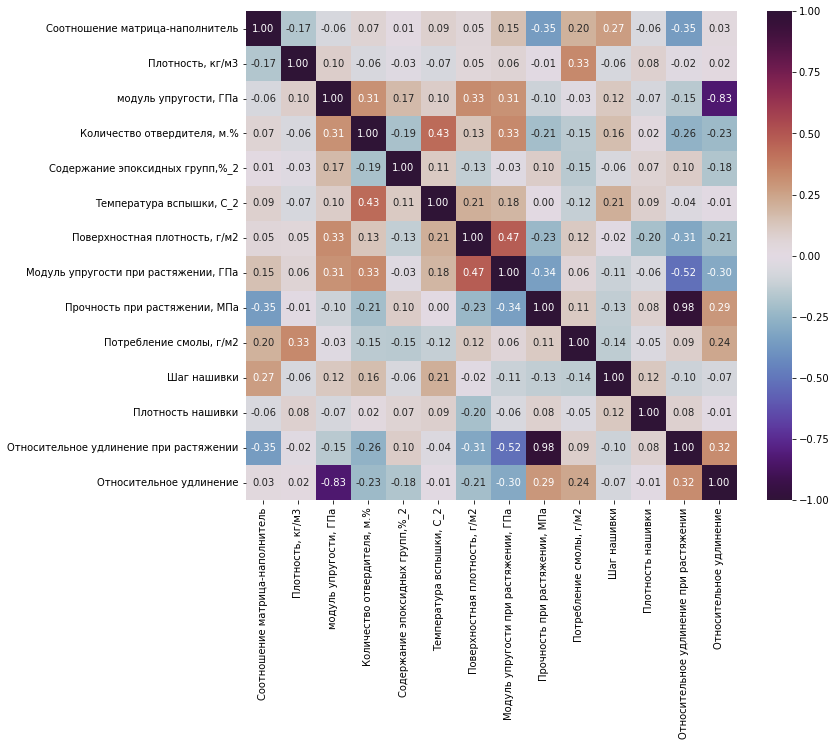

In [117]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:63].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [118]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:63].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:63].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:63], df_dnorm[col1][0:63]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель








Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=-0.353, p-value=0.005


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.270, p-value=0.032


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=-0.355, p-value=0.004


2
Плотность, кг/м3








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Потребление смолы, г/м2 : 		 
Statistics=0.334, p-value=0.008





3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.307, p-value=0.014



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.329, p-value=0.009

Наименование колонок и строк С корреляцией: 
м

Выводы: статистически значимыми по критерию Пирсона после нормализации для 1_1-ой части 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.353, p-value=0.005
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.270, p-value=0.032
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=-0.355, p-value=0.004
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.334, p-value=0.008
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.307, p-value=0.014
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.329, p-value=0.009
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.305, p-value=0.015
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.832, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.430, p-value=0.000
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.334, p-value=0.007
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.262, p-value=0.038
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.475, p-value=0.000
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.308, p-value=0.014
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.342, p-value=0.006
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.519, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение : Statistics=-0.299, p-value=0.017
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.980, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.288, p-value=0.022
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.323, p-value=0.010

или:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.353, p-value=0.005
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.270, p-value=0.032
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.334, p-value=0.008
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.307, p-value=0.014
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.329, p-value=0.009
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.305, p-value=0.015
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.430, p-value=0.000
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.334, p-value=0.007
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.475, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.342, p-value=0.006

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

Вывод: проявились значимые корреляции, которые имеют явный физический смысл:

модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа - Statistics=0.305 (прямая)

Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа - Statistics=-0.342 (обратная)

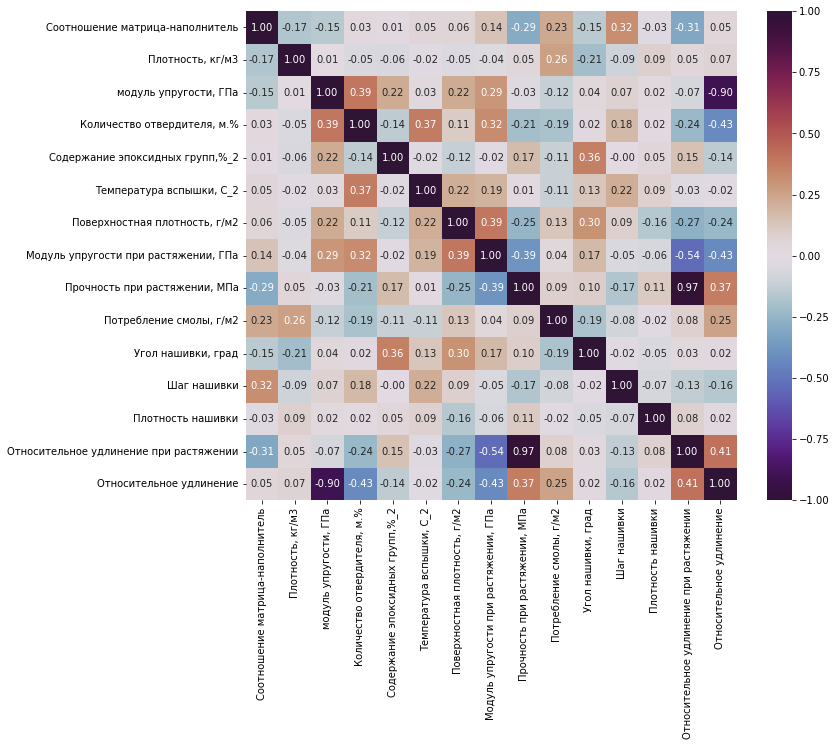

In [119]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:63]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [120]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:63].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:63].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:63][col], df_norm[0:63][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель








Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=-0.294, p-value=0.020



Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.318, p-value=0.011


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=-0.310, p-value=0.014


2
Плотность, кг/м3








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Потребление смолы, г/м2 : 		 
Statistics=0.262, p-value=0.038






3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.394, p-value=0.001




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.294, p-value=0.020







Наименование колонок и строк С

Вывод: в 1_1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.294, p-value=0.020
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.318, p-value=0.011
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=-0.310, p-value=0.014
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.262, p-value=0.038
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.394, p-value=0.001
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.294, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.905, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.374, p-value=0.003
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.323, p-value=0.010
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.426, p-value=0.001
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.362, p-value=0.004
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.390, p-value=0.002
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.303, p-value=0.016
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.267, p-value=0.035
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.385, p-value=0.002
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.535, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение : Statistics=-0.425, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.967, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.371, p-value=0.003
    Потребление смолы, г/м2  &  Относительное удлинение : Statistics=0.249, p-value=0.049
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.408, p-value=0.001

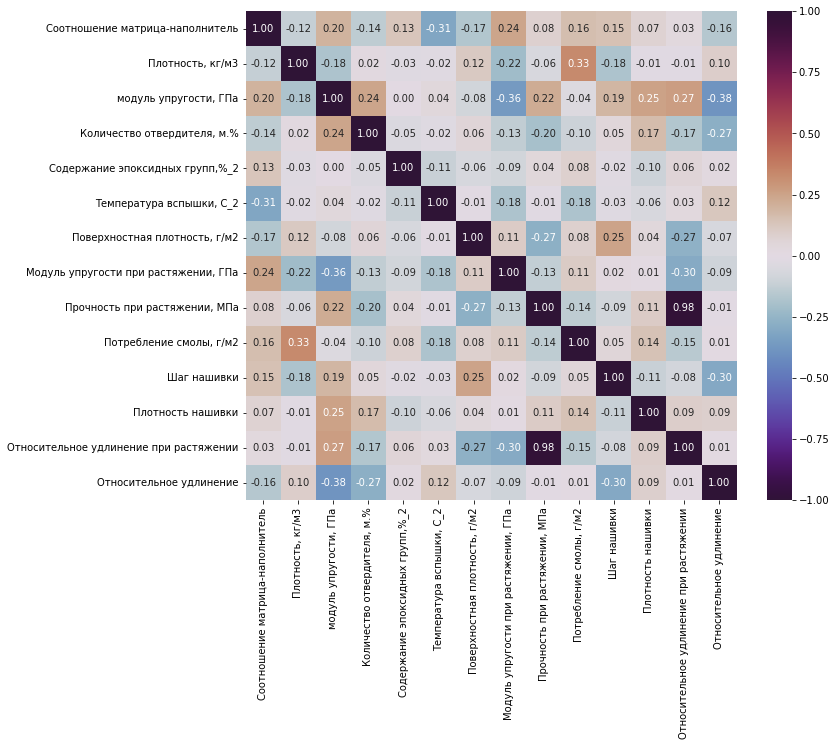

In [121]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[64:127].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [122]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[64:127].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[64:127].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][64:127], df_dnorm[col1][64:127]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.314, p-value=0.012









2
Плотность, кг/м3








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Потребление смолы, г/м2 : 		 
Statistics=0.332, p-value=0.008





3
модуль упругости, ГПа





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.362, p-value=0.004




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.253, p-value=0.046

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение при растяжении : 		 
Statistics=0.270, p-value=0.033

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.385, p-value=0.002

4
Количество отвердителя, м.%










Наименование к

Выводы: статистически значимыми по критерию Пирсона после нормализации для 1_2-ой части 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.314, p-value=0.012
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.332, p-value=0.008
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.362, p-value=0.004
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.253, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение при растяжении : Statistics=0.270, p-value=0.033
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.385, p-value=0.002
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.275, p-value=0.029
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.271, p-value=0.032
    Поверхностная плотность, г/м2  &  Шаг нашивки : Statistics=0.248, p-value=0.050
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.265, p-value=0.036
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.297, p-value=0.018
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.984, p-value=0.000
    Шаг нашивки  &  Относительное удлинение : Statistics=-0.305, p-value=0.015
    
или:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.314, p-value=0.012
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.332, p-value=0.008
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.362, p-value=0.004
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.253, p-value=0.046
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.271, p-value=0.032
    Поверхностная плотность, г/м2  &  Шаг нашивки : Statistics=0.248, p-value=0.050

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

Вывод: здесь связи не наполнены физическим смыслом:

модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.362 (обратная)

Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.271 (обратная)

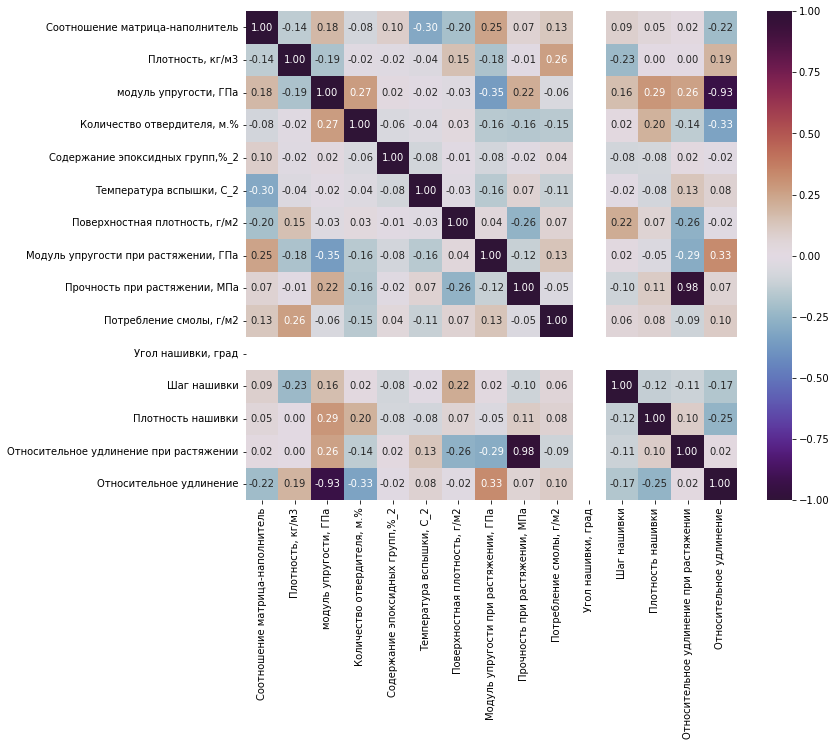

In [123]:
# Матрица корреляции по Спирмену
df2 = df_norm[64:127]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [124]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[64:127].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[64:127].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[64:127][col], df_norm[64:127][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.305, p-value=0.015


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.250, p-value=0.048



Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Потребление смолы, г/м2 : 		 
Statistics=0.264, p-value=0.037

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.272, p-value=0.031




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 1_2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.305, p-value=0.015
    Соотношение матрица-наполнитель  &  Модуль упругости при растяжении, ГПа : Statistics=0.250, p-value=0.048
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.264, p-value=0.037
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.272, p-value=0.031
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.354, p-value=0.004
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.293, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение при растяжении : Statistics=0.258, p-value=0.041
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.934, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.328, p-value=0.009
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.258, p-value=0.041
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.265, p-value=0.036
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.287, p-value=0.023
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение : Statistics=0.329, p-value=0.008
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.252, p-value=0.046

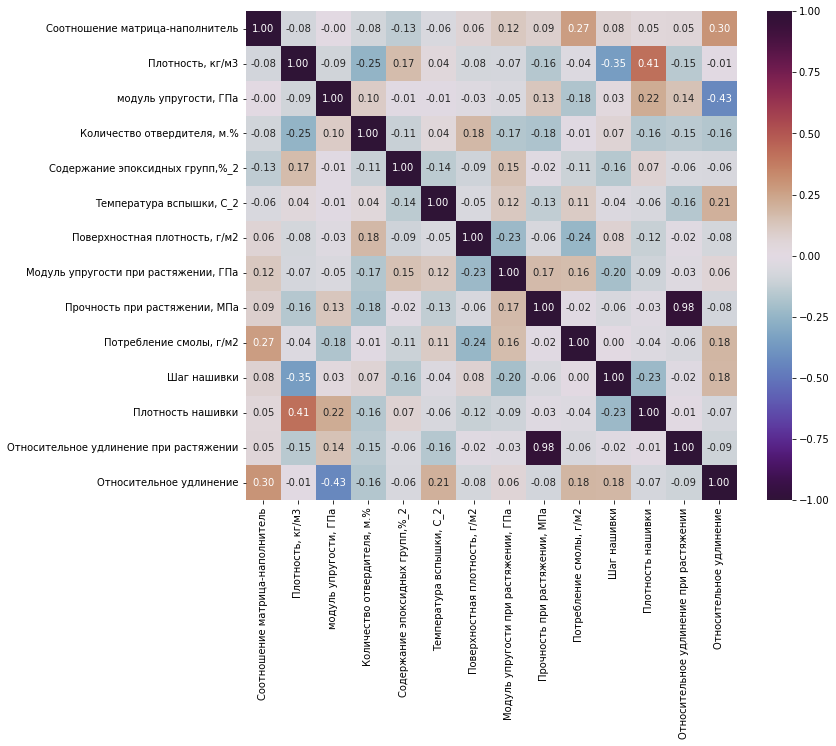

In [125]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[128:191].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [126]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[128:191].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[128:191].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][128:191], df_dnorm[col1][128:191]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.270, p-value=0.033




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение : 		 
Statistics=0.300, p-value=0.017

2
Плотность, кг/м3


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Количество отвердителя, м.% : 		 
Statistics=-0.251, p-value=0.047







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.350, p-value=0.005

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.412, p-value=0.001



3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.434, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Темп

Выводы: статистически значимыми по критерию Пирсона после нормализации для 1_3-ой части 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.270, p-value=0.033
    Соотношение матрица-наполнитель  &  Относительное удлинение : Statistics=0.300, p-value=0.017
    Плотность, кг/м3  &  Количество отвердителя, м.% : Statistics=-0.251, p-value=0.047
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.350, p-value=0.005
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.412, p-value=0.001
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.434, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.978, p-value=0.000

или:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.270, p-value=0.033
    Плотность, кг/м3  &  Количество отвердителя, м.% : Statistics=-0.251, p-value=0.047
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.350, p-value=0.005
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.412, p-value=0.001   

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

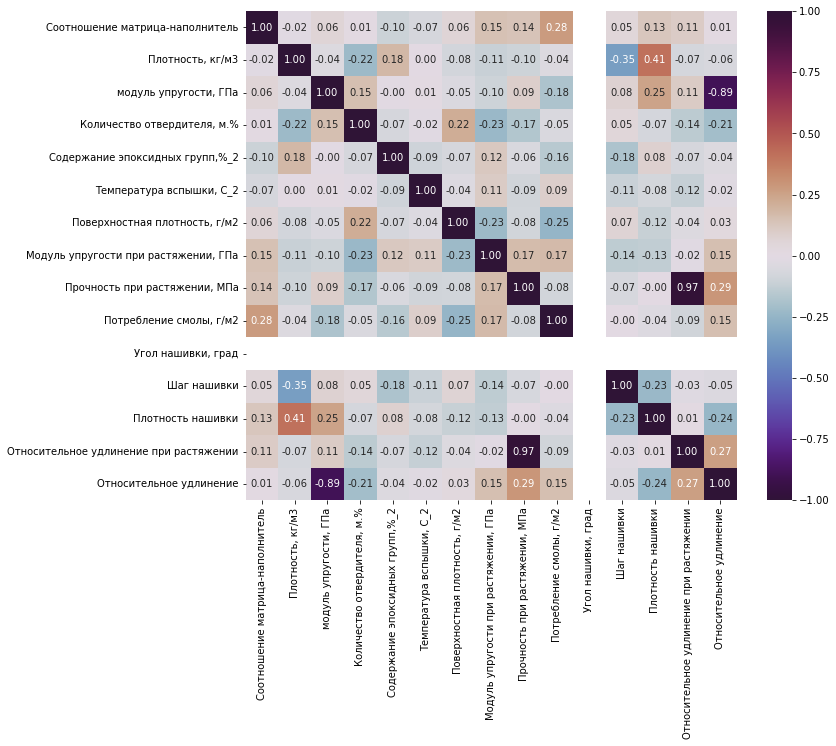

In [127]:
# Матрица корреляции по Спирмену
df3 = df_norm[128:191]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [128]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[128:191].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[128:191].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[128:191][col], df_norm[128:191][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.278, p-value=0.028

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.346, p-value=0.005

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.408, p-value=0.001



3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.894, p-

Вывод: в 1_3-ьей части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.278, p-value=0.028
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.346, p-value=0.005
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.408, p-value=0.001
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.894, p-value=0.000
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=-0.248, p-value=0.050
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.292, p-value=0.020
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.265, p-value=0.036

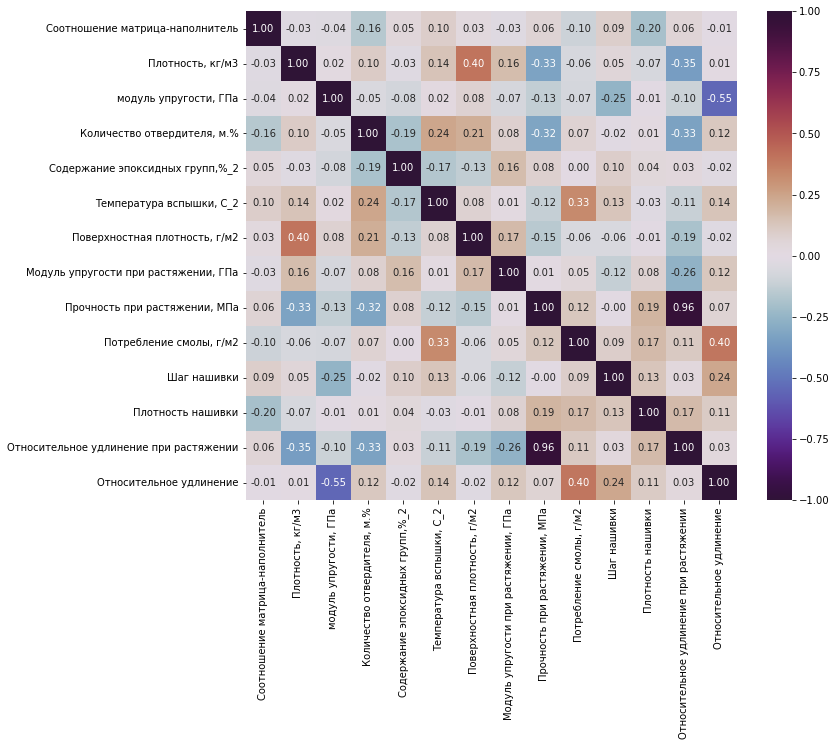

In [129]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[192:255].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [130]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[192:255].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[192:255].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][192:255], df_dnorm[col1][192:255]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.402, p-value=0.001


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.329, p-value=0.009




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.350, p-value=0.005


3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=-0.254, p-value=0.045



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.549, p-value=0.000

4
Количество отвердителя, м.%





Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.318, p-value=0.011




Наименование колонок и строк 

Выводы: статистически значимыми по критерию Пирсона после нормализации для 1_4-ой части 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.402, p-value=0.001
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.329, p-value=0.009
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.350, p-value=0.005
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=-0.254, p-value=0.045
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.549, p-value=0.000
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.318, p-value=0.011
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.330, p-value=0.008
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.333, p-value=0.008
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.260, p-value=0.040
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.962, p-value=0.000
    Потребление смолы, г/м2  &  Относительное удлинение : Statistics=0.396, p-value=0.001
    
или:
    
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.402, p-value=0.001
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.329, p-value=0.009
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=-0.254, p-value=0.045
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.318, p-value=0.011
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.333, p-value=0.008

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

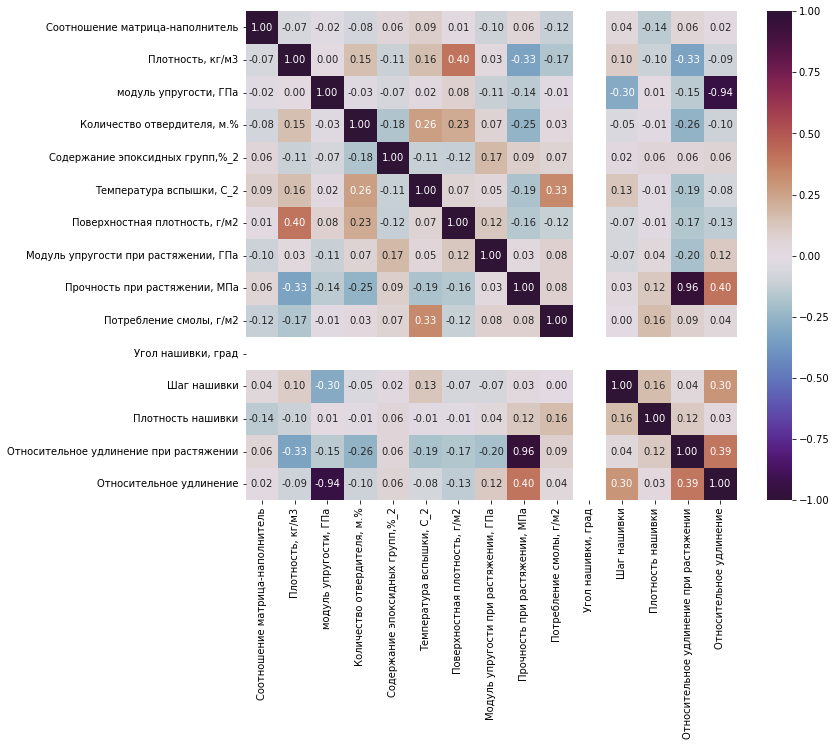

In [131]:
# Матрица корреляции по Спирмену
df4 = df_norm[192:255]
corr = df4.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [132]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[192:255].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[192:255].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[192:255][col], df_norm[192:255][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.403, p-value=0.001


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.326, p-value=0.009


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.327, p-value=0.009


3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Stati

Вывод: в 1_4-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.403, p-value=0.001
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.326, p-value=0.009
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.327, p-value=0.009
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=-0.296, p-value=0.018
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.943, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.265, p-value=0.036
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.252, p-value=0.046
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.256, p-value=0.043
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.334, p-value=0.007
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.961, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.401, p-value=0.001
    Шаг нашивки  &  Относительное удлинение : Statistics=0.296, p-value=0.018
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.391, p-value=0.002

Выводы: следует присмотреться к 1_1-ой и 1_2-ой частям датасета

ДОПОЛНЕНИЕ № 2: разрезание 1_1-ой и 1_2-ой частей датасета, на две части каждая

In [133]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Шаг нашивки                             1023 non-null   floa

In [134]:
# 1_1_1-ая часть датасета
df_dnorm[0:31].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.276998,0.548135,0.704292,0.002917
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.576985,0.704292,0.002917
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.276998,0.673149,0.704292,0.002917
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.346248,0.451971,0.704292,0.002917
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.346248,0.548135,0.704292,0.002847


In [135]:
# 1_1_2-ая часть датасета
df_dnorm[32:63].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
32,0.555074,0.584616,0.176582,0.274587,0.534842,0.494613,0.083586,0.183844,0.507099,0.454888,0.623246,0.451971,0.553713,0.005846
33,0.498806,0.379301,0.618435,0.639075,0.480598,0.686289,0.269337,0.603199,0.450606,0.437980,0.623246,0.548135,0.414173,0.000978
34,0.485694,0.311350,0.524244,0.504927,0.609643,0.619422,0.291471,0.410500,0.729017,0.415949,0.623246,0.576985,0.708798,0.002014
35,0.549410,0.171152,0.395704,0.351187,0.489062,0.571642,0.410639,0.283824,0.765150,0.575301,0.623246,0.673149,0.778141,0.003051
36,0.391069,0.372211,0.276461,0.223616,0.523796,0.718665,0.326179,0.547042,0.303619,0.496068,0.692496,0.451971,0.292642,0.002463


In [136]:
# 1_2_1-ая часть датасета
df_dnorm[64:95].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
64,0.417603,0.472308,0.214092,0.367240,0.647152,0.526581,0.480194,0.324717,0.699905,0.422939,0.428747,0.305842,0.704389,0.005897
65,0.252923,0.550115,0.174143,0.539377,0.544473,0.645917,0.120088,0.522177,0.209087,0.655184,0.538949,0.525381,0.211171,0.003643
66,0.773644,0.594230,0.316707,0.476553,0.348020,0.407035,0.467458,0.697473,0.428445,0.649884,0.914026,0.638174,0.378528,0.002579
67,0.588854,0.286936,0.300700,0.384336,0.483725,0.610773,0.241850,0.512119,0.683267,0.512382,0.351986,0.484723,0.641228,0.003899
68,0.440674,0.234067,0.619955,0.491596,0.270883,0.703421,0.053352,0.384420,0.832440,0.154009,0.735630,0.457258,0.812382,0.001804


In [137]:
# 1_2_2-ая часть датасета
df_dnorm[96:127].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
96,0.426416,0.582488,0.129962,0.339968,0.406469,0.338379,0.392797,0.553834,0.349029,0.369095,0.636850,0.472456,0.332245,0.006583
97,0.591256,0.584091,0.554696,0.296229,0.413808,0.785106,0.330828,0.274249,0.716389,0.331303,0.654710,0.372676,0.734036,0.001829
98,0.338147,0.518454,0.472829,0.697631,0.360663,0.679992,0.253541,0.295608,0.796991,0.373170,0.100438,0.528796,0.805166,0.002514
99,0.684967,0.419999,0.181194,0.500314,0.463948,0.344881,0.069297,0.416250,0.956165,0.264162,0.304854,0.470811,0.917763,0.009004
100,0.610582,1.000000,0.363371,0.421865,0.496553,0.612257,0.274512,0.253941,0.554787,0.967365,0.312511,0.449812,0.583449,0.002614


In [138]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:31].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:31][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.947, p-value=0.127
Плотность, кг/м3 : 	 	 	Statistics=0.941, p-value=0.090
модуль упругости, ГПа : 	 	 	Statistics=0.948, p-value=0.134
Количество отвердителя, м.% : 	 	 	Statistics=0.778, p-value=0.000
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.642, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics=0.665, p-value=0.000
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.844, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.908, p-value=0.012
Прочность при растяжении, МПа : 	 	 	Statistics=0.913, p-value=0.015
Потребление смолы, г/м2 : 	 	 	Statistics=0.863, p-value=0.001
Шаг нашивки : 	 	 	Statistics=0.906, p-value=0.010
Плотность нашивки : 	 	 	Statistics=0.712, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.883, p-value=0.003
Относительное удлинение : 	 	 	Statistics=0.822, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [139]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[32:63].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[32:63][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.972, p-value=0.569
Плотность, кг/м3 : 	 	 	Statistics=0.967, p-value=0.440
модуль упругости, ГПа : 	 	 	Statistics=0.962, p-value=0.324
Количество отвердителя, м.% : 	 	 	Statistics=0.977, p-value=0.721
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.959, p-value=0.273
Температура вспышки, С_2 : 	 	 	Statistics=0.981, p-value=0.828
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.964, p-value=0.372
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.958, p-value=0.264
Прочность при растяжении, МПа : 	 	 	Statistics=0.993, p-value=0.999
Потребление смолы, г/м2 : 	 	 	Statistics=0.949, p-value=0.150
Шаг нашивки : 	 	 	Statistics=0.928, p-value=0.038
Плотность нашивки : 	 	 	Statistics=0.927, p-value=0.037
Относительное удлинение при растяжении : 	 	 	Statistics=0.985, p-value=0.935
Относительное удлинение : 	 	 	Statistics=0.941, p-value=0.089

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [140]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[64:95].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[64:95][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.975, p-value=0.667
Плотность, кг/м3 : 	 	 	Statistics=0.972, p-value=0.567
модуль упругости, ГПа : 	 	 	Statistics=0.953, p-value=0.189
Количество отвердителя, м.% : 	 	 	Statistics=0.964, p-value=0.372
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.969, p-value=0.499
Температура вспышки, С_2 : 	 	 	Statistics=0.979, p-value=0.770
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.949, p-value=0.150
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.963, p-value=0.346
Прочность при растяжении, МПа : 	 	 	Statistics=0.971, p-value=0.538
Потребление смолы, г/м2 : 	 	 	Statistics=0.977, p-value=0.712
Шаг нашивки : 	 	 	Statistics=0.972, p-value=0.576
Плотность нашивки : 	 	 	Statistics=0.990, p-value=0.991
Относительное удлинение при растяжении : 	 	 	Statistics=0.967, p-value=0.434
Относительное удлинение : 	 	 	Statistics=0.462, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [141]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[96:127].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[96:127][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.984, p-value=0.919
Плотность, кг/м3 : 	 	 	Statistics=0.976, p-value=0.687
модуль упругости, ГПа : 	 	 	Statistics=0.958, p-value=0.260
Количество отвердителя, м.% : 	 	 	Statistics=0.975, p-value=0.660
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.969, p-value=0.497
Температура вспышки, С_2 : 	 	 	Statistics=0.975, p-value=0.675
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.935, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.960, p-value=0.284
Прочность при растяжении, МПа : 	 	 	Statistics=0.935, p-value=0.061
Потребление смолы, г/м2 : 	 	 	Statistics=0.914, p-value=0.016
Шаг нашивки : 	 	 	Statistics=0.979, p-value=0.771
Плотность нашивки : 	 	 	Statistics=0.952, p-value=0.181
Относительное удлинение при растяжении : 	 	 	Statistics=0.924, p-value=0.031
Относительное удлинение : 	 	 	Statistics=0.235, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [142]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:31][col])
    df2=np.array(df_dnorm[32:63][col])
    df3=np.array(df_dnorm[64:95][col])
    df4=np.array(df_dnorm[96:127][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=4.381, p-value=0.223
Плотность, кг/м3 : 	 	 	Statistics=1.216, p-value=0.749
модуль упругости, ГПа : 	 	 	Statistics=0.881, p-value=0.830
Количество отвердителя, м.% : 	 	 	Statistics=2.176, p-value=0.537
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=2.266, p-value=0.519
Температура вспышки, С_2 : 	 	 	Statistics=2.533, p-value=0.469
Поверхностная плотность, г/м2 : 	 	 	Statistics=2.335, p-value=0.506
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=4.576, p-value=0.206
Прочность при растяжении, МПа : 	 	 	Statistics=2.534, p-value=0.469
Потребление смолы, г/м2 : 	 	 	Statistics=5.142, p-value=0.162
Шаг нашивки : 	 	 	Statistics=8.204, p-value=0.042
Плотность нашивки : 	 	 	Statistics=2.629, p-value=0.452
Относительное удлинение при растяжении : 	 	 	Statistics=1.676, p-value=0.642
Относительное удлинение : 	 	 	Statistics=0.905, p-value=0.824

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [143]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:31].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[32:63].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[64:95].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[96:127].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=2.110, p-value=0.550
Плотность, кг/м3 : 	 	 	Statistics=1.955, p-value=0.582
модуль упругости, ГПа : 	 	 	Statistics=0.406, p-value=0.939
Количество отвердителя, м.% : 	 	 	Statistics=1.335, p-value=0.721
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=5.052, p-value=0.168
Температура вспышки, С_2 : 	 	 	Statistics=2.652, p-value=0.449
Поверхностная плотность, г/м2 : 	 	 	Statistics=1.568, p-value=0.667
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=1.877, p-value=0.598
Прочность при растяжении, МПа : 	 	 	Statistics=1.955, p-value=0.582
Потребление смолы, г/м2 : 	 	 	Statistics=9.077, p-value=0.028
Шаг нашивки : 	 	 	Statistics=7.529, p-value=0.057
Плотность нашивки : 	 	 	Statistics=2.187, p-value=0.534
Относительное удлинение при растяжении : 	 	 	Statistics=0.639, p-value=0.888
Относительное удлинение : 	 	 	Statistics=1.181, p-value=0.758

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [144]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:31][col])
    df2=np.array(df_dnorm[32:63][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.226, p-value=0.414
Плотность, кг/м3 : 	 	 	Statistics=0.194, p-value=0.615
модуль упругости, ГПа : 	 	 	Statistics=0.194, p-value=0.615
Количество отвердителя, м.% : 	 	 	Statistics=0.323, p-value=0.079
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.387, p-value=0.018
Температура вспышки, С_2 : 	 	 	Statistics=0.323, p-value=0.079
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.258, p-value=0.256
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.258, p-value=0.256
Прочность при растяжении, МПа : 	 	 	Statistics=0.226, p-value=0.414
Потребление смолы, г/м2 : 	 	 	Statistics=0.290, p-value=0.147
Шаг нашивки : 	 	 	Statistics=0.452, p-value=0.003
Плотность нашивки : 	 	 	Statistics=0.290, p-value=0.147
Относительное удлинение при растяжении : 	 	 	Statistics=0.194, p-value=0.615
Относительное удлинение : 	 	 	Statistics=0.194, p-value=0.615

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [145]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[32:63][col])
    df2=np.array(df_dnorm[64:95][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.097, p-value=0.999
Плотность, кг/м3 : 	 	 	Statistics=0.161, p-value=0.823
модуль упругости, ГПа : 	 	 	Statistics=0.161, p-value=0.823
Количество отвердителя, м.% : 	 	 	Statistics=0.226, p-value=0.414
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.129, p-value=0.963
Температура вспышки, С_2 : 	 	 	Statistics=0.194, p-value=0.615
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.194, p-value=0.615
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.129, p-value=0.963
Прочность при растяжении, МПа : 	 	 	Statistics=0.226, p-value=0.414
Потребление смолы, г/м2 : 	 	 	Statistics=0.290, p-value=0.147
Шаг нашивки : 	 	 	Statistics=0.226, p-value=0.414
Плотность нашивки : 	 	 	Statistics=0.226, p-value=0.414
Относительное удлинение при растяжении : 	 	 	Statistics=0.226, p-value=0.414
Относительное удлинение : 	 	 	Statistics=0.161, p-value=0.823

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [146]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[64:95][col])
    df2=np.array(df_dnorm[96:127][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.194, p-value=0.615
Плотность, кг/м3 : 	 	 	Statistics=0.161, p-value=0.823
модуль упругости, ГПа : 	 	 	Statistics=0.097, p-value=0.999
Количество отвердителя, м.% : 	 	 	Statistics=0.161, p-value=0.823
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.194, p-value=0.615
Температура вспышки, С_2 : 	 	 	Statistics=0.194, p-value=0.615
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.161, p-value=0.823
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.097, p-value=0.999
Прочность при растяжении, МПа : 	 	 	Statistics=0.290, p-value=0.147
Потребление смолы, г/м2 : 	 	 	Statistics=0.161, p-value=0.823
Шаг нашивки : 	 	 	Statistics=0.258, p-value=0.256
Плотность нашивки : 	 	 	Statistics=0.258, p-value=0.256
Относительное удлинение при растяжении : 	 	 	Statistics=0.258, p-value=0.256
Относительное удлинение : 	 	 	Statistics=0.129, p-value=0.963

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [147]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:31][col])
    df2=np.array(df_dnorm[32:63][col])
    df1=np.array(df_dnorm[64:95][col])
    df2=np.array(df_dnorm[96:127][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=178.287, p-value=0.000
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=201.310, p-value=0.000
Плотность, кг/м3 : 	 	 	Statistics Bartlet=177.604, p-value=0.000
Плотность, кг/м3 : 	 	 	Statistics F-test=209.344, p-value=0.000
модуль упругости, ГПа : 	 	 	Statistics Bartlet=197.048, p-value=0.000
модуль упругости, ГПа : 	 	 	Statistics F-test=71.517, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=164.677, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics F-test=259.032, p-value=0.000
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=157.702, p-value=0.000
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=183.701, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=137.239, p-value=0.000
Температура вспышки, С_2 : 	 	 	Statistics F-test=530.059, p-value=0.000
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=211.906, p-value=0.000
Поверхностная плотность, г/м

Вывод: Дисперсии неравны, поэтому данный тест не может быть применен здесь

Корреляционные матрицы для частей датасета:

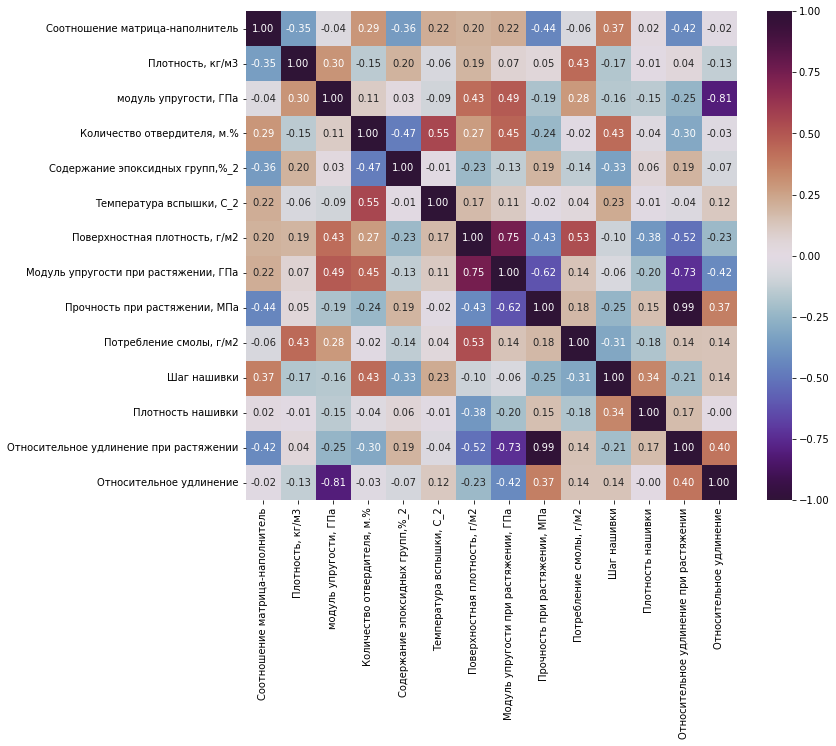

In [148]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:31].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [149]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:31].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:31].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:31], df_dnorm[col1][0:31]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=-0.357, p-value=0.049




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=-0.441, p-value=0.013


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.368, p-value=0.042


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=-0.425, p-value=0.017


2
Плотность, кг/м3








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Потребление смолы, г/м2 : 		 
Statistics=0.433, p-value=0.015





3
модуль упругости, ГПа




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.427, p-value=0.017

Наименование колонок и строк С 

Вывод:

    Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : Statistics=-0.357, p-value=0.049
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.441, p-value=0.013
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.368, p-value=0.042
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=-0.425, p-value=0.017
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.433, p-value=0.015
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.427, p-value=0.017
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.488, p-value=0.005
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.807, p-value=0.000
    Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : Statistics=-0.471, p-value=0.007
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.554, p-value=0.001
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.452, p-value=0.011
    Количество отвердителя, м.%  &  Шаг нашивки : Statistics=0.428, p-value=0.016
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.745, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.426, p-value=0.017
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.527, p-value=0.002
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.376, p-value=0.037
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.516, p-value=0.003
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.617, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.734, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение : Statistics=-0.424, p-value=0.017
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.987, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.366, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.403, p-value=0.025
    
или:


    Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : Statistics=-0.357, p-value=0.049
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.441, p-value=0.013
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.368, p-value=0.042
    Плотность, кг/м3  &  Потребление смолы, г/м2 : Statistics=0.433, p-value=0.015
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.427, p-value=0.017
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.488, p-value=0.005
    Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : Statistics=-0.471, p-value=0.007
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.554, p-value=0.001
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.452, p-value=0.011
    Количество отвердителя, м.%  &  Шаг нашивки : Statistics=0.428, p-value=0.016
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.745, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.426, p-value=0.017
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.527, p-value=0.002
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.376, p-value=0.037
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.617, p-value=0.000

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

Вывод:

модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.488 (прямая)

Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.617 (обратная)

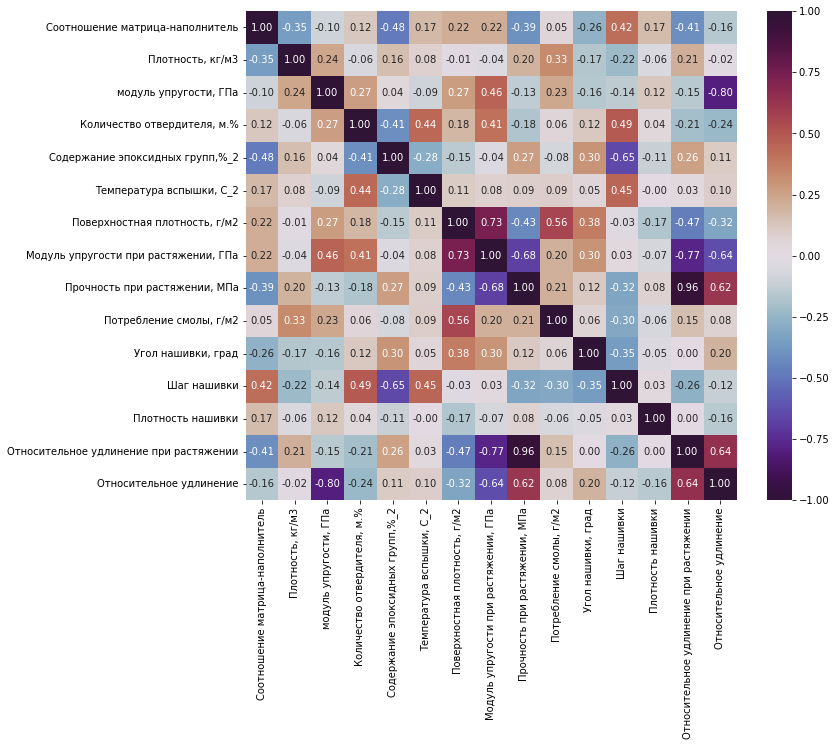

In [150]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:31]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [151]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:31].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:31].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:31][col], df_norm[0:31][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=-0.479, p-value=0.006




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=-0.394, p-value=0.028



Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.422, p-value=0.018


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=-0.405, p-value=0.024


2
Плотность, кг/м3














3
модуль упругости, ГПа





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.455, p-value=0.010







Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.796, p-value=0.000

4
Количе

Вывод: в 1_1_1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : Statistics=-0.479, p-value=0.006
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=-0.394, p-value=0.028
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.422, p-value=0.018
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=-0.405, p-value=0.024
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=0.455, p-value=0.010
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.796, p-value=0.000
    Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : Statistics=-0.406, p-value=0.023
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.443, p-value=0.013
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=0.410, p-value=0.022
    Количество отвердителя, м.%  &  Шаг нашивки : Statistics=0.488, p-value=0.005
    Содержание эпоксидных групп,%_2  &  Шаг нашивки : Statistics=-0.654, p-value=0.000
    Температура вспышки, С_2  &  Шаг нашивки : Statistics=0.446, p-value=0.012
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.732, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.428, p-value=0.016
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.560, p-value=0.001
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.376, p-value=0.037
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.468, p-value=0.008
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.682, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.770, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение : Statistics=-0.636, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.961, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.618, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.643, p-value=0.000

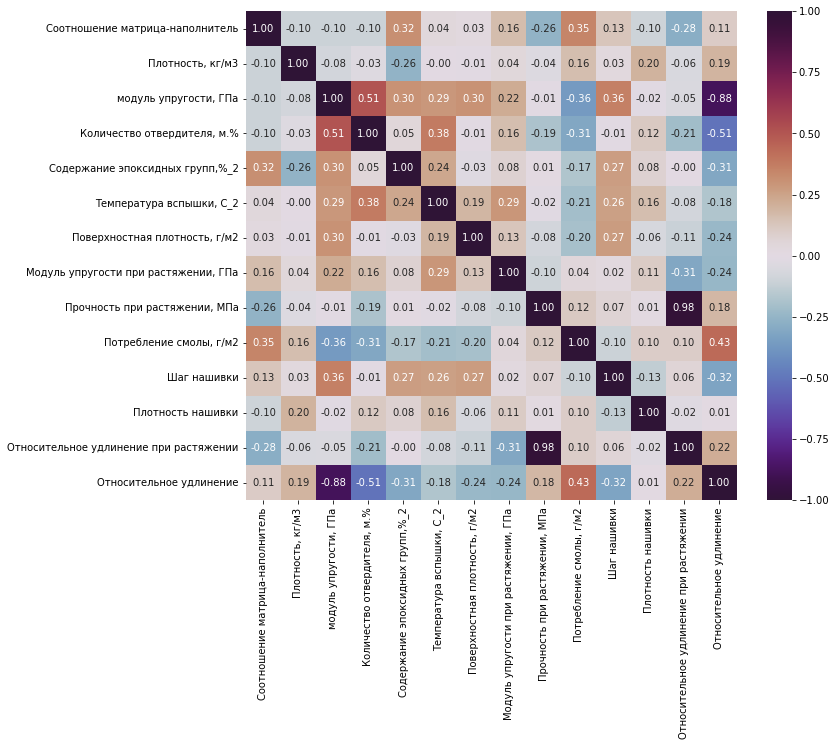

In [152]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[32:63].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [153]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[32:63].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[32:63].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][32:63], df_dnorm[col1][32:63]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3













3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.508, p-value=0.004






Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Потребление смолы, г/м2 : 		 
Statistics=-0.363, p-value=0.045

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=0.363, p-value=0.045



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.882, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.377, p-value=0.037








Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Относительное удлинение : 		 
Statistics=-0.509, p-value=0.003

5
Содержание эпоксидных групп,%_2




Вывод:

    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.508, p-value=0.004
    модуль упругости, ГПа  &  Потребление смолы, г/м2 : Statistics=-0.363, p-value=0.045
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.363, p-value=0.045
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.882, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.377, p-value=0.037
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.509, p-value=0.003
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000
    Потребление смолы, г/м2  &  Относительное удлинение : Statistics=0.432, p-value=0.015

или: 


    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.508, p-value=0.004
    модуль упругости, ГПа  &  Потребление смолы, г/м2 : Statistics=-0.363, p-value=0.045
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.363, p-value=0.045
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.377, p-value=0.037

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

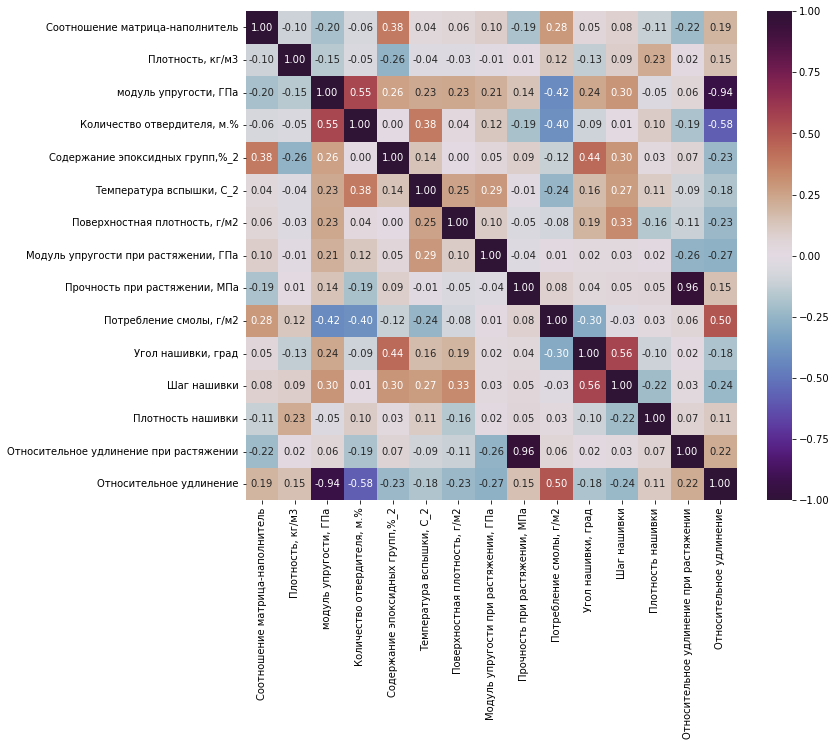

In [154]:
# Матрица корреляции по Спирмену
df2 = df_norm[32:63]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [155]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[32:63].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[32:63].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[32:63][col], df_norm[32:63][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=0.379, p-value=0.036











2
Плотность, кг/м3














3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.554, p-value=0.001






Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Потребление смолы, г/м2 : 		 
Statistics=-0.421, p-value=0.018





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.936, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.379, p-value=0.035




Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Потребление смолы, г/м2 : 		 
Statistics=-0.403, p-value=0.024





Наи

Вывод: в 1_1_2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Содержание эпоксидных групп,%_2 : Statistics=0.379, p-value=0.036
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.554, p-value=0.001
    модуль упругости, ГПа  &  Потребление смолы, г/м2 : Statistics=-0.421, p-value=0.018
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.936, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.379, p-value=0.035
    Количество отвердителя, м.%  &  Потребление смолы, г/м2 : Statistics=-0.403, p-value=0.024
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.583, p-value=0.001
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.437, p-value=0.014
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.962, p-value=0.000
    Потребление смолы, г/м2  &  Относительное удлинение : Statistics=0.500, p-value=0.004
    Угол нашивки, град  &  Шаг нашивки : Statistics=0.562, p-value=0.001

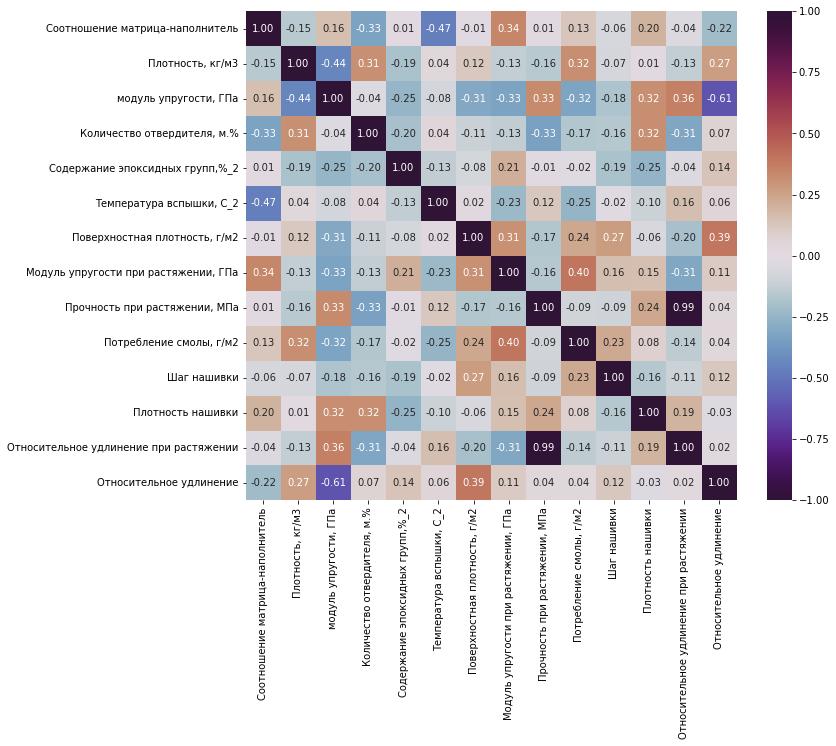

In [156]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[64:95].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [157]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[64:95].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[64:95].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][64:95], df_dnorm[col1][64:95]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.465, p-value=0.008









2
Плотность, кг/м3

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  модуль упругости, ГПа : 		 
Statistics=-0.441, p-value=0.013












3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение при растяжении : 		 
Statistics=0.363, p-value=0.044

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.612, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2









7
Поверхностная плотность, г/м2







Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Относительное удлинение : 		 
Statistics=0.389, p-value=0.031

8
Модуль упругости при раст

Вывод:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.465, p-value=0.008
    Плотность, кг/м3  &  модуль упругости, ГПа : Statistics=-0.441, p-value=0.013
    модуль упругости, ГПа  &  Относительное удлинение при растяжении : Statistics=0.363, p-value=0.044
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.612, p-value=0.000
    Поверхностная плотность, г/м2  &  Относительное удлинение : Statistics=0.389, p-value=0.031
    Модуль упругости при растяжении, ГПа  &  Потребление смолы, г/м2 : Statistics=0.397, p-value=0.027
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.989, p-value=0.000
    
или:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.465, p-value=0.008
    Плотность, кг/м3  &  модуль упругости, ГПа : Statistics=-0.441, p-value=0.013
    Модуль упругости при растяжении, ГПа  &  Потребление смолы, г/м2 : Statistics=0.397, p-value=0.027

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

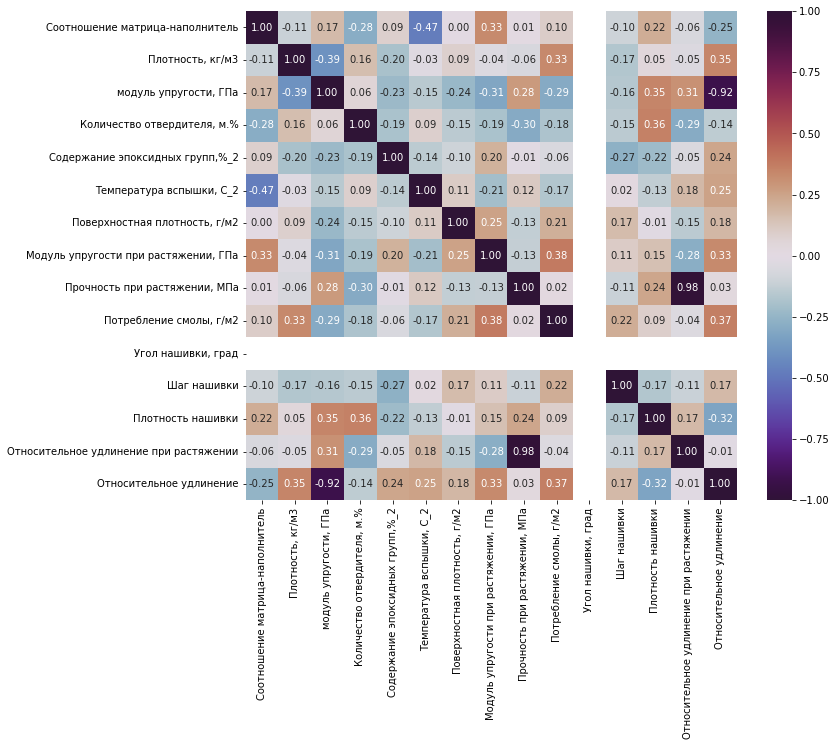

In [158]:
# Матрица корреляции по Спирмену
df3 = df_norm[64:95]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [159]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[64:95].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[64:95].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[64:95][col], df_norm[64:95][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.473, p-value=0.007





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  модуль упругости, ГПа : 		 
Statistics=-0.393, p-value=0.029








Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.919, p-value=0.000

4
Количество отвердителя, м.%







Наименование колонок и строк С корреляцией: 
Количество отве

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 1_2_1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.473, p-value=0.007
    Плотность, кг/м3  &  модуль упругости, ГПа : Statistics=-0.393, p-value=0.029
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.919, p-value=0.000
    Количество отвердителя, м.%  &  Плотность нашивки : Statistics=0.360, p-value=0.047
    Модуль упругости при растяжении, ГПа  &  Потребление смолы, г/м2 : Statistics=0.381, p-value=0.034
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.984, p-value=0.000
    Потребление смолы, г/м2  &  Относительное удлинение : Statistics=0.367, p-value=0.042

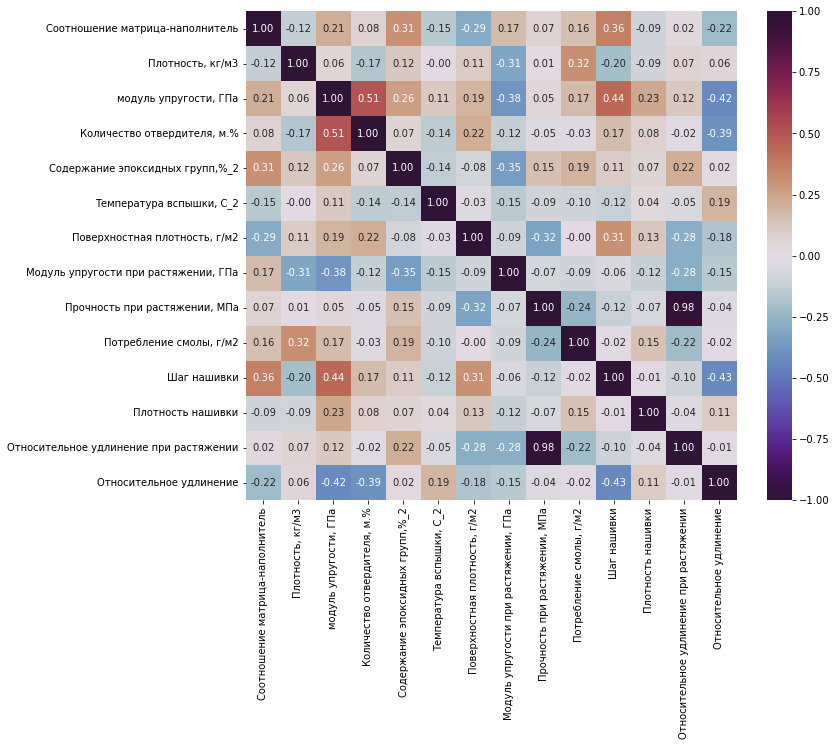

In [160]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[96:127].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [161]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[96:127].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[96:127].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][96:127], df_dnorm[col1][96:127]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.364, p-value=0.044




2
Плотность, кг/м3













3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.509, p-value=0.003




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.382, p-value=0.034



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=0.441, p-value=0.013



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.425, p-value=0.017

4
Количество отвердителя, м.%










Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Относительное удлинение : 		 
Statistics=-0.392, p-value=0.029

5
Содержание эпоксидных групп,%_

Вывод:

    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.364, p-value=0.044
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.509, p-value=0.003
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.382, p-value=0.034
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.441, p-value=0.013
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.425, p-value=0.017
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.392, p-value=0.029
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000
    Шаг нашивки  &  Относительное удлинение : Statistics=-0.430, p-value=0.016
    
    
или:

    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.364, p-value=0.044
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.509, p-value=0.003
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.382, p-value=0.034
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.441, p-value=0.013

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016

Вывод: данная связь физического смысла не имеет

модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.382 (обратная)

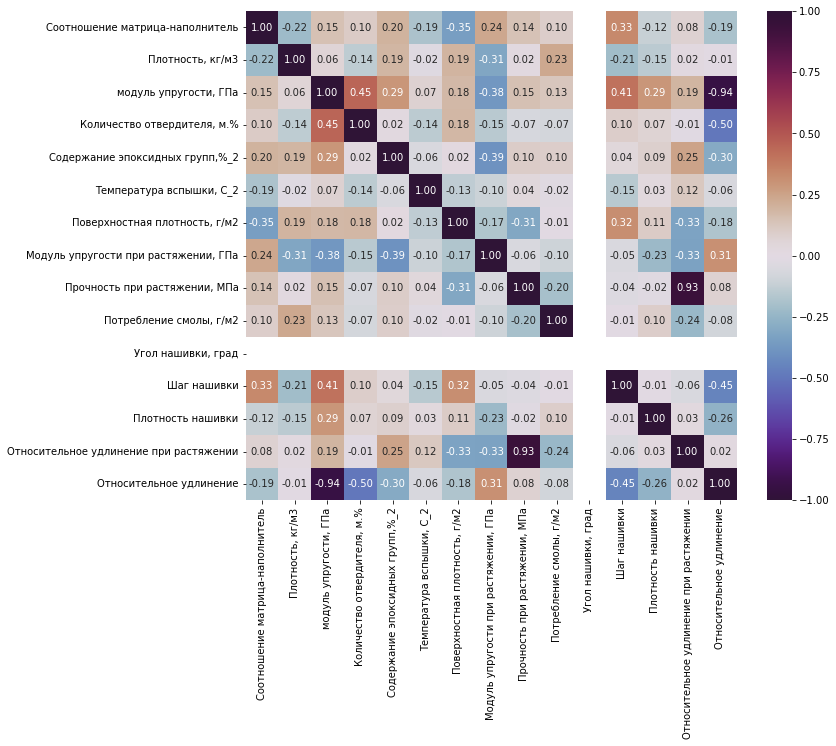

In [162]:
# Матрица корреляции по Спирмену
df3 = df_norm[96:127]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [163]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[96:127].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[96:127].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[96:127][col], df_norm[96:127][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.448, p-value=0.012




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.376, p-value=0.037



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=0.408, p-value=0.023



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		

Вывод: в 1_2_2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.448, p-value=0.012
    модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : Statistics=-0.376, p-value=0.037
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.408, p-value=0.023
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.942, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.496, p-value=0.005
    Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.394, p-value=0.028
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.935, p-value=0.000
    Шаг нашивки  &  Относительное удлинение : Statistics=-0.451, p-value=0.011

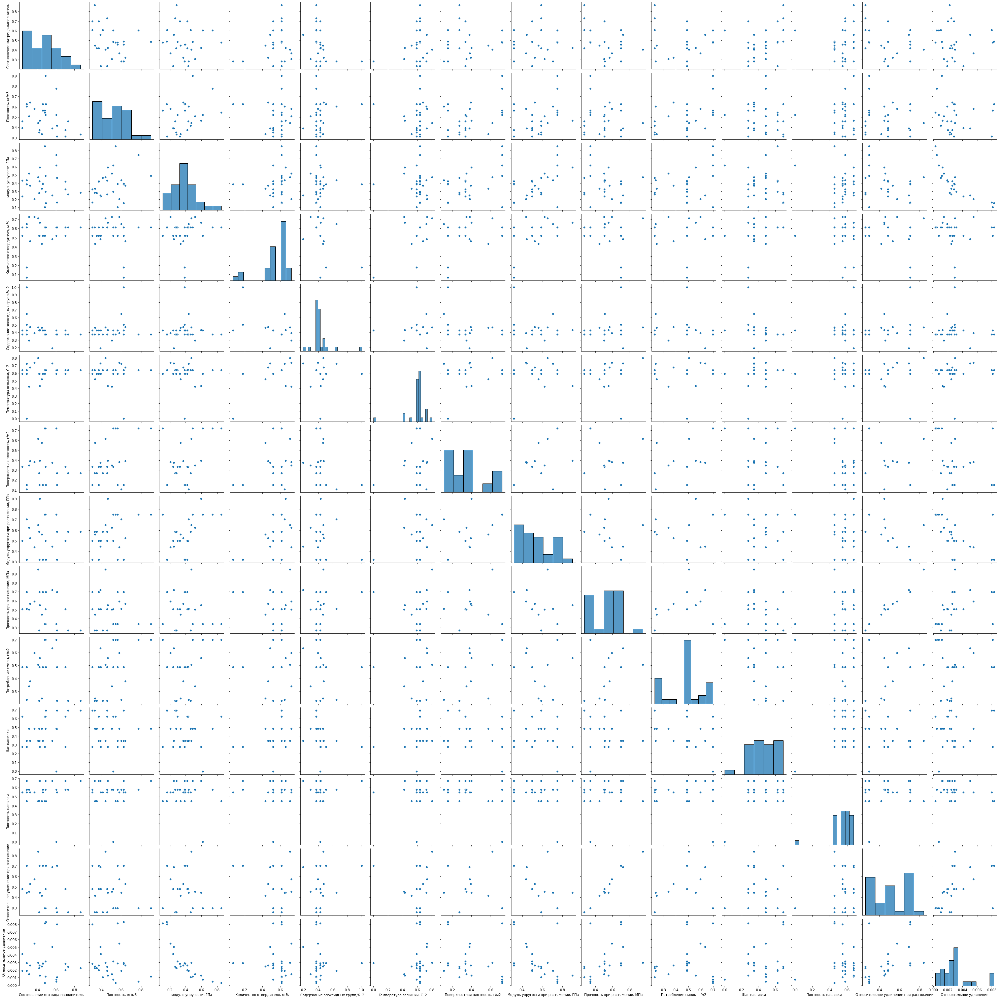

In [164]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(df_dnorm[0:31], height=3)

In [165]:
df_dnorm[0:31].columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [166]:
df_dnorm[0:31].index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30],
           dtype='int64')

In [167]:
mod_elasts = df_dnorm['Модуль упругости при растяжении, ГПа'][23:31]
str_elasts = df_dnorm['Прочность при растяжении, МПа'][23:31]
labels = range(23,31)

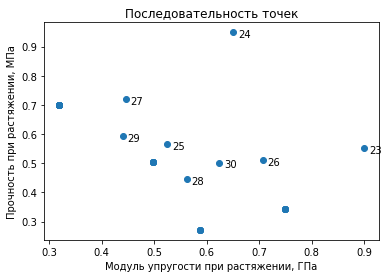

In [168]:
plt.scatter(df_dnorm['Модуль упругости при растяжении, ГПа'][0:31], df_dnorm['Прочность при растяжении, МПа'][0:31],)
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("Модуль упругости при растяжении, ГПа")
plt.ylabel("Прочность при растяжении, МПа")
plt.show()

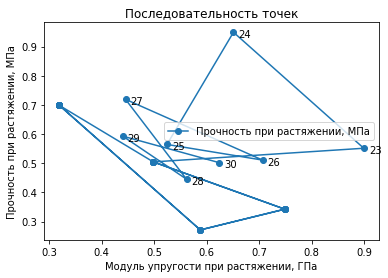

In [169]:
df_dnorm[0:31].plot('Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', style='o-')
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("Модуль упругости при растяжении, ГПа")
plt.ylabel("Прочность при растяжении, МПа")
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


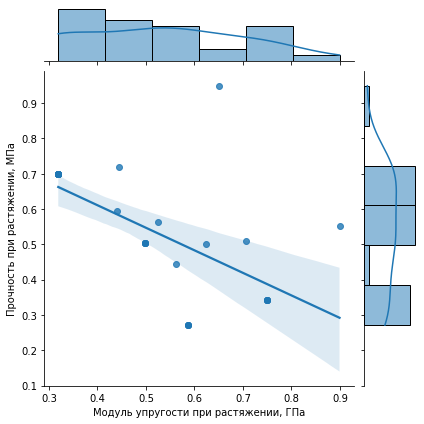

In [170]:
sns.jointplot('Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', data=df_dnorm[0:31], kind="reg")

<AxesSubplot:xlabel='Относительное удлинение при растяжении'>

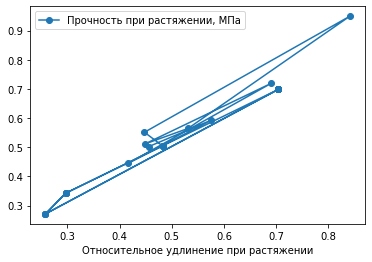

In [171]:
df_dnorm[0:31].plot('Относительное удлинение при растяжении', 'Прочность при растяжении, МПа', style='o-')

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


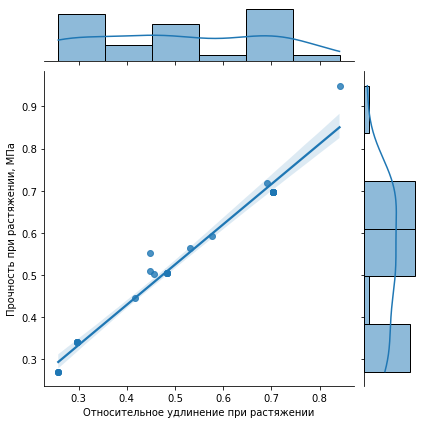

In [172]:
sns.jointplot('Относительное удлинение при растяжении', 'Прочность при растяжении, МПа', data=df_dnorm[0:31], kind="reg")

In [173]:
mod_elasts = df_dnorm['модуль упругости, ГПа'][0:31]
str_elasts = df_dnorm['Модуль упругости при растяжении, ГПа'][0:31]
labels = range(0,31)

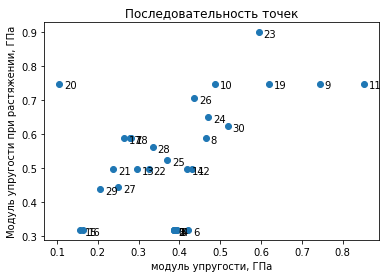

In [174]:
plt.scatter(df_dnorm['модуль упругости, ГПа'][0:31], df_dnorm['Модуль упругости при растяжении, ГПа'][0:31],)
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("модуль упругости, ГПа")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.show()

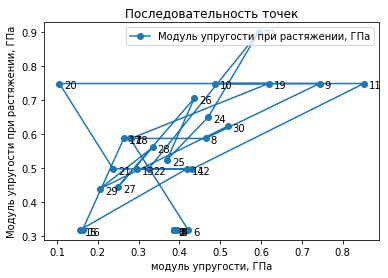

In [175]:
df_dnorm[0:31].plot('модуль упругости, ГПа', 'Модуль упругости при растяжении, ГПа', style='o-')
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("модуль упругости, ГПа")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


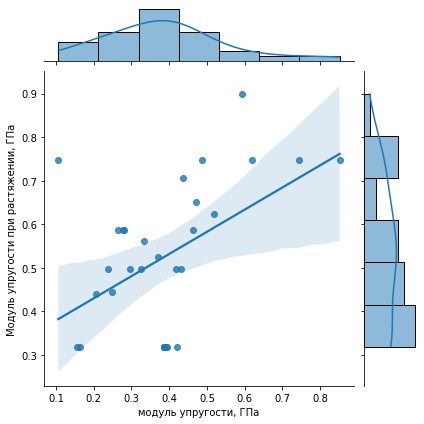

In [176]:
sns.jointplot('модуль упругости, ГПа', 'Модуль упругости при растяжении, ГПа', data=df_dnorm[0:31], kind="reg")

In [177]:
mod_elasts = df_dnorm['Относительное удлинение при растяжении'][23:31]
str_elasts = df_dnorm['Модуль упругости при растяжении, ГПа'][23:31]
labels = range(23,31)

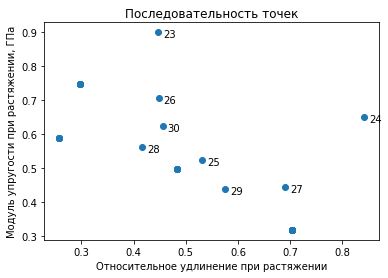

In [178]:
plt.scatter(df_dnorm['Относительное удлинение при растяжении'][0:31], df_dnorm['Модуль упругости при растяжении, ГПа'][0:31],)
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("Относительное удлинение при растяжении")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.show()

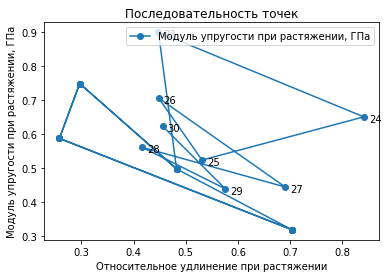

In [179]:
df_dnorm[0:31].plot('Относительное удлинение при растяжении', 'Модуль упругости при растяжении, ГПа', style='o-')
for label, mod_elast, str_elast in zip(labels, mod_elasts, str_elasts):
    plt.annotate(label, xy=(mod_elast, str_elast), xytext=(5, -5), textcoords='offset points')
plt.title("Последовательность точек")
plt.xlabel("Относительное удлинение при растяжении")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


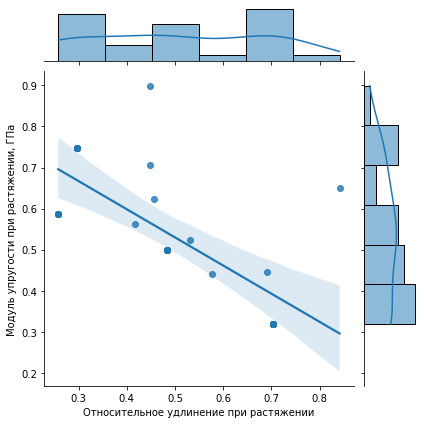

In [180]:
sns.jointplot('Относительное удлинение при растяжении', 'Модуль упругости при растяжении, ГПа', data=df_dnorm[0:31], kind="reg")

Вывод: можно увидеть, что точки с индексами 23-го по 31-ый не укладываются в линейную зависимость между 'Модуль упругости при растяжении, ГПа' и 'Прочность при растяжении, МПа'